## IMPORTATION DES LIBRAIRIES NECESSAIRES

In [1]:
! pip install pandas_profiling

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scipy as sp

import pandas as pd
from pandas_profiling import ProfileReport
import statistics
import seaborn as sns
from sklearn import set_config
from sklearn.compose import ColumnTransformer, make_column_selector
from sklearn.impute import SimpleImputer, KNNImputer
from sklearn.linear_model import LinearRegression, Ridge, RidgeCV, Lasso
from sklearn.metrics import (r2_score,
                             mean_squared_error,
                             mean_absolute_percentage_error,
                             max_error, make_scorer
                            )
from sklearn.model_selection import train_test_split, GridSearchCV, cross_validate,cross_val_score, KFold
from sklearn.pipeline import make_pipeline, Pipeline
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler, OneHotEncoder, OrdinalEncoder

set_config(display="diagram", print_changed_only=False)

pd.set_option('display.max_columns', None)
pd.set_option('display.max_colwidth', None)

# PRESENTATION DES DONNEES

Les donnees soumis a notre analyse ont ete importe du site KAGGLE. 
Elles sont groupees en deux dossiers : un dossier Train sur lequel nous construirons le modele de prediction et un dossier test pour le test.

# TRAIN

In [77]:
pd.set_option('display.max_column', 80)

In [78]:
train = pd.read_csv("C:/Users/DELL/Desktop/ISE 2/Machine Learning/train.csv")
train.head(50)

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,...,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,...,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,...,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,...,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,...,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,...,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000
5,6,50,RL,85.0,14115,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Mitchel,Norm,Norm,1Fam,1.5Fin,5,5,1993,1995,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,Wood,Gd,TA,No,GLQ,732,Unf,0,64,796,GasA,...,Y,SBrkr,796,566,0,1362,1,0,1,1,1,1,TA,5,Typ,0,NaN,Attchd,1993.0,Unf,2,480,TA,TA,Y,40,30,0,320,0,0,NaN,MnPrv,Shed,700,10,2009,WD,Normal,143000
6,7,20,RL,75.0,10084,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Somerst,Norm,Norm,1Fam,1Story,8,5,2004,2005,Gable,CompShg,VinylSd,VinylSd,Stone,186.0,Gd,TA,PConc,Ex,TA,Av,GLQ,1369,Unf,0,317,1686,GasA,...,Y,SBrkr,1694,0,0,1694,1,0,2,0,3,1,Gd,7,Typ,1,Gd,Attchd,2004.0,RFn,2,636,TA,TA,Y,255,57,0,0,0,0,NaN,NaN,NaN,0,8,2007,WD,Normal,307000
7,8,60,RL,NaN,10382,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,NWAmes,PosN,Norm,1Fam,2Story,7,6,1973,1973,Gable,CompShg,HdBoard,HdBoard,Stone,240.0,TA,TA,CBlock,Gd,TA,Mn,ALQ,859,BLQ,32,216,1107,GasA,...,Y,SBrkr,1107,983,0,2090,1,0,2,1,3,1,TA,7,Typ,2,TA,Attchd,1973.0,RFn,2,484,TA,TA,Y,235,204,228,0,0,0,NaN,NaN,Shed,350,11,2009,WD,Normal,200000
8,9,50,RM,51.0,6120,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,OldTown,Artery,Norm,1Fam,1.5Fin,7,5,1931,1950,Gable,CompShg,BrkFace,Wd Shng,None,0.0,TA,TA,BrkTil,TA,TA,No,Unf,0,Unf,0,952,952,GasA,...,Y,FuseF,1022,752,0,1774,0,0,2,0,2,2,TA,8,Min1,2,TA,Detchd,1931.0,Unf,2,468,Fa,TA,Y,90,0,205,0,0,0,NaN,NaN,NaN,0,4,2008,WD,Abnorml,129900
9,10,190,RL,50.0,7420,Pave,NaN,Reg,Lvl,AllPub,Corner,Gtl,BrkSide,Artery,Artery,2fmCon,1.5Unf,5,6,1939,1950,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,BrkTil,TA,TA,No,GLQ,851,Unf,0,140,991,

In [79]:
train=train.drop(['Id'], axis= 1)

Informations sur les donnees contenu dans le dossier train.

###   I. PRESENTATION GENERALE

cette rubrique donne une vue d'ensemble du jeu de donnees Train . Il est constitué de 1460 individus et 80 variables  : dont 79 variables explicatives et la variable a predire : la variable SalePrice. Le jeu de donné Train contient 37 variables numériques, 43 variables catégorielles . Il ne contient pas de doublons. 

    ces caractéristiques peuvent être groupées en différents ensemble. Ainsi on a :

        - Informations générales sur la proprité :la Localisation de la propieté ( MSZoning, LotFrontage, Street, Alley, LotShape, LandContour, Utilities, LotConfig, LandSlope, Neighborhood, Condition1, Condition2), la surface (LotArea) et les appréciations générales ( OverallQual, OverallCond)
        
        - informations sur la Maison :   BldgType, HouseStyle, RoofStyle, RoofMatl, Exterior1st, Exterior2nd, MasVnrType, ExterQual, ExterCond, Foundation, Heating, HeatingQC, CentralAir, Electrical, KitchenQual, Functional, FireplaceQu, YearBuilt, YearRemodAdd, MasVnrArea, 1stFlrSF, 2ndFlrSF, LowQualFinSF, GrLivArea, FullBath, HalfBath, BedroomAbvGr, KitchenAbvGr, TotRmsAbvGrd, Fireplaces,PavedDrive
        
        - informations sur le Sous sol : BsmtFullBath, BsmtHalfBath, BsmtQual, BsmtCond, BsmtExposure, BsmtFinType1, BsmtFinType2, BsmtFinSF1, BsmtFinSF2, BsmtUnfSF, TotalBsmtSF
        
        - informations sur le Garage : GarageYrBlt, GarageCars, GarageArea, GarageType, GarageFinish, GarageQual, GarageCond
        
  
         - informations sur la terasse : WoodDeckSF
         
         - informations sur le porche: EnclosedPorch, 3SsnPorch, ScreenPorch, OpenPorchSF,
      
         - informations sur la vente:   MoSold, YrSold, SaleCondition, SaleType, SalePrice
        
        

In [8]:
train.shape

(1460, 80)

<AxesSubplot:ylabel='les differentes categories de variables'>

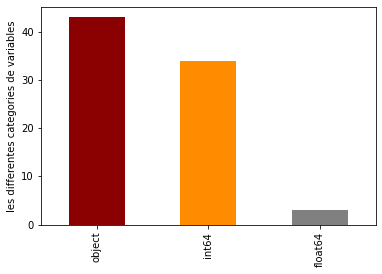

In [6]:
train.dtypes.value_counts().plot.bar( ylabel='les differentes categories de variables',color=['darkred','darkorange','grey'])

In [39]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 80 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   MSSubClass     1460 non-null   int64  
 1   MSZoning       1460 non-null   object 
 2   LotFrontage    1201 non-null   float64
 3   LotArea        1460 non-null   int64  
 4   Street         1460 non-null   object 
 5   Alley          91 non-null     object 
 6   LotShape       1460 non-null   object 
 7   LandContour    1460 non-null   object 
 8   Utilities      1460 non-null   object 
 9   LotConfig      1460 non-null   object 
 10  LandSlope      1460 non-null   object 
 11  Neighborhood   1460 non-null   object 
 12  Condition1     1460 non-null   object 
 13  Condition2     1460 non-null   object 
 14  BldgType       1460 non-null   object 
 15  HouseStyle     1460 non-null   object 
 16  OverallQual    1460 non-null   int64  
 17  OverallCond    1460 non-null   int64  
 18  YearBuil

In [7]:
categorical_features = train.select_dtypes(include="object").columns
print(f"Categorical features:\n {categorical_features}\n")

numerical_features = train.select_dtypes(include="number").columns
print(f"Numerical features:\n {numerical_features}")

print('il y a',categorical_features.shape,'variables categorielles')
print('il y a',numerical_features.shape,'variables numeriques')
   

Categorical features:
 Index(['MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities',
       'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2',
       'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st',
       'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation',
       'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2',
       'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual',
       'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual',
       'GarageCond', 'PavedDrive', 'PoolQC', 'Fence', 'MiscFeature',
       'SaleType', 'SaleCondition'],
      dtype='object')

Numerical features:
 Index(['MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond',
       'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2',
       'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF',
       'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBat

## Analyse des valeurs manquantes

Nous pouvons observer que pour la majorité de nos variables, il n'y a pas de valeurs manquantes. 
Les variables PoolQC, Miscfeature, Alley et Fence ont un nombre cuissant de valeurs non ou mal renseignées. 
par ailleurs nous remarquons aussi la présence de deux groupes de données: l'un constitué des caractéristiques sur le(s) garage(s) et l'autre sur le(s) sous-sol.
 De l'analyse approfondie, il ressort que nombre important de maison ayant les caractéristiques PoolQC, Miscfeature, Alley et Fence non renseignés est du à l'absence de ces dernieres. Cela pourrait traduire le fait que ces caractéristiques ne sont pas determinantes dans le choix des maisons à AMES (car absentes chez la plupart de sujets). 
Notons par ailleurs l'interdépendance entre: 

    - la variable PoolQC et la variable PoolArea car on ne peut avoir la surface d'une piscine que si cette dernière existe.
    - la variable Miscfeature et la variable MiscVal car on ne peut estimer le prix d'un bien qui n'existe pas 

<AxesSubplot:>

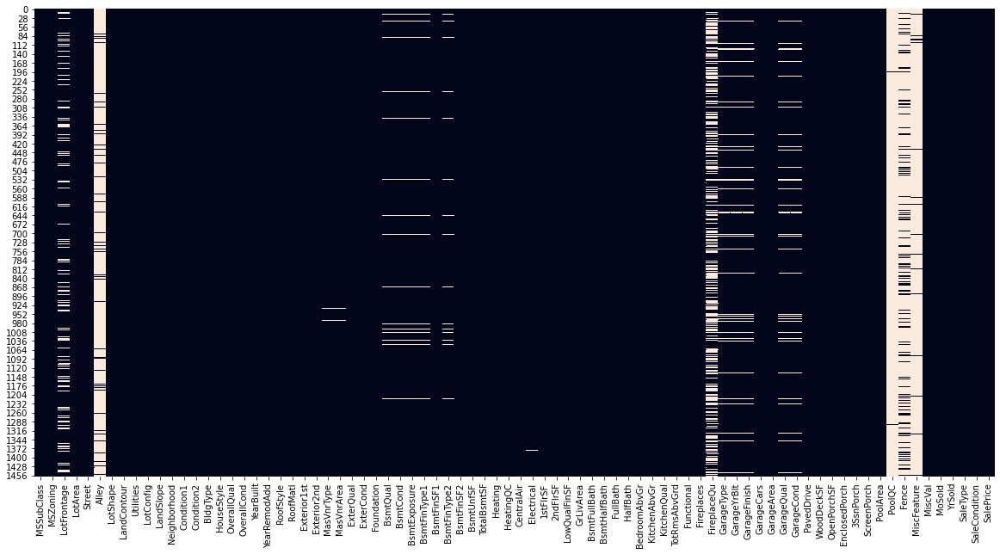

In [4]:
plt.figure(figsize=(20,10))
sns.heatmap(train.isna(), cbar=False)

In [91]:
nbre_val_manq = train.isnull().sum().sort_values(ascending=False)
percentmissing = (train.isnull().sum()/train.isnull().count()).sort_values(ascending=False)
wholena = pd.concat([nbre_val_manq,percentmissing], axis=1)
wholena.head(20)

,0,1
PoolQC,1453,0.995205
MiscFeature,1406,0.963014
Alley,1369,0.937671
Fence,1179,0.807534
FireplaceQu,690,0.472603
LotFrontage,259,0.177397
GarageQual,81,0.055479
GarageType,81,0.055479
GarageFinish,81,0.055479
GarageCond,81,0.055479


In [11]:
train.PoolQC.unique()
pd.crosstab(train.PoolQC, "freq")

col_0,freq
PoolQC,
Ex,2
Fa,2
Gd,3


In [12]:
train.MiscFeature.unique()
pd.crosstab(train.MiscFeature, "freq")

col_0,freq
MiscFeature,
Gar2,2
Othr,2
Shed,49
TenC,1


In [13]:
train.Alley.unique()
pd.crosstab(train.Alley, "freq")

col_0,freq
Alley,
Grvl,50
Pave,41


In [14]:
train.Fence.unique()
pd.crosstab(train.Fence, "freq")

col_0,freq
Fence,
GdPrv,59
GdWo,54
MnPrv,157
MnWw,11


### Analyse du premier groupe : le(s) garage (s)

7 variables donnent les renseignement sur les garages si existant dont 4 qualitatives: GarageType,GarageFinish,GarageQual,GarageCond et 3 quantitatives: GarageCars,GarageArea,GarageYrBlt.
81 maisons n'ont pas de garage. 

### Analyse du deuxième groupe : le(s) sous-sol

S'agissant du sous sol, 11 variables décrivent les caractéristiques du sous sol dont 5 qualitatives : BsmtQual, BsmtCond, BsmtExposure, BsmtFinType1, BsmtFinType2 et 6 quantitatives : BsmtFullBath, BsmtHalfBath,BsmtFinSF1, BsmtFinSF2, BsmtUnfSF, TotalBsmtSF.
    
    - il y a une erreur sur l'individu Id= 333 car la variable BsmtFinType2 a ete renseigne 'NA:(no basement)' et pourtant le sous sol existe.
    - il y a une erreur sur l'individu Id= 949 car la variable BsmtExposure a ete renseigne 'NA (no basement)' et pourtant le sous sol existe.
    
les valeurs manquantes sur le reste des variables caractérisant le sous sol sont dues a l'absence de sous sol


In [16]:
train.BsmtFinType2.unique()
pd.crosstab(train.BsmtFinType2, "freq")

col_0,freq
BsmtFinType2,
ALQ,19
BLQ,33
GLQ,14
LwQ,46
Rec,54
Unf,1256


In [17]:
train.BsmtExposure.unique()
pd.crosstab(train.BsmtExposure, "freq")

col_0,freq
BsmtExposure,
Av,221
Gd,134
Mn,114
No,953


### Autres valeurs

Pour les variables MasVnrType,MasVnrArea et Electrical, les donnees manquantes n'ont pas été renseignées. NAN a tout son sens pour ces variables

In [18]:
train.MasVnrType.unique()
pd.crosstab(train.MasVnrType, "freq")

col_0,freq
MasVnrType,
BrkCmn,15
BrkFace,445
None,864
Stone,128


# # Conclusion

Les valeurs manquantes observées sont pour la plupart dues au libelé de la modalité NA: absence de cette caractéristique qui est interprété comme NAN (non renséigné)  par python.  Le traitement se fera par recodage de cette modalité en NO ou NONE selon les cas.

##  CORRECTION

In [80]:
# PoolQC : data description says NA means "no pool"
train.loc[:, "PoolQC"] = train.loc[:, "PoolQC"].fillna("No")

# MiscFeature : data description says NA means None
train.loc[:, "MiscFeature"] = train.loc[:, "MiscFeature"].fillna("None")

# Alley : data description says NA means "no alley access"
train.loc[:, "Alley"] = train.loc[:, "Alley"].fillna("No")

# Fence : data description says NA means "no fence"
train.loc[:, "Fence"] = train.loc[:, "Fence"].fillna("No")

# FireplaceQu : data description says NA means "no fireplace"
train.loc[:, "FireplaceQu"] = train.loc[:, "FireplaceQu"].fillna("No")

# LotFrontage : NA most likely means no lot frontage
train.loc[:, "LotFrontage"] = train.loc[:, "LotFrontage"].fillna(0)

# GarageType etc : data description says NA for garage features is "no garage" 
train.loc[:, "GarageType"] = train.loc[:, "GarageType"].fillna("No")
train.loc[:, "GarageFinish"] = train.loc[:, "GarageFinish"].fillna("No")
train.loc[:, "GarageQual"] = train.loc[:, "GarageQual"].fillna("No")
train.loc[:, "GarageCond"] = train.loc[:, "GarageCond"].fillna("No")
train.loc[:, "GarageYrBlt"] = train.loc[:, "GarageYrBlt"].fillna(0)

# BsmtQual etc : data description says NA for basement features is "no basement" and error for id 333 and 949
train.loc[333, "BsmtFinType2"] = "Unf"
train.loc[949, "BsmtExposure"] =  "Av"
train.loc[:, "BsmtQual"] = train.loc[:, "BsmtQual"].fillna("No")
train.loc[:, "BsmtCond"] = train.loc[:, "BsmtCond"].fillna("No")
train.loc[:, "BsmtExposure"] = train.loc[:, "BsmtExposure"].fillna("No")
train.loc[:, "BsmtFinType1"] = train.loc[:, "BsmtFinType1"].fillna("No")
train.loc[:, "BsmtFinType2"] = train.loc[:, "BsmtFinType2"].fillna("No")
# MasVnrType : NA most likely means no veneer
train.loc[:, "MasVnrType"] = train.loc[:, "MasVnrType"].fillna("None")
train.loc[:, "MasVnrArea"] = train.loc[:, "MasVnrArea"].fillna(0)
# Electrical : NA most likely means not available
train.loc[:, "Electrical"] = train.loc[:, "Electrical"].fillna("SBrkr")

In [93]:
nbre_val_manq = train.isnull().sum().sort_values(ascending=False)
percentmissing = (train.isnull().sum()/train.isnull().count()).sort_values(ascending=False)
wholena = pd.concat([nbre_val_manq,percentmissing], axis=1)
wholena.head(20)

,0,1
MSSubClass,0,0.0
GarageArea,0,0.0
GarageFinish,0,0.0
GarageYrBlt,0,0.0
GarageType,0,0.0
FireplaceQu,0,0.0
Fireplaces,0,0.0
Functional,0,0.0
TotRmsAbvGrd,0,0.0
KitchenQual,0,0.0


Nous souhaitons créer une variable RemoddAdd qui nous dira si la maison a été renover ou pas. 
et la variables Age de la maison, qui sera la différence entre l'année de vente et l'année de construction
Ainsi, nous observerons l'influence des rénovations sur le prix des maisons.

In [81]:
train['Age']=""

In [82]:
for i in range (0,1460):

    train['Age'][i]= train['YrSold'][i] - train['YearBuilt'][i] 

<ipython-input-82-b45349b087fc>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train['Age'][i]= train['YrSold'][i] - train['YearBuilt'][i]


In [83]:
train['Age']

0        5
1       31
2        7
3       91
4        8
        ..
1455     8
1456    32
1457    69
1458    60
1459    43
Name: Age, Length: 1460, dtype: object

In [85]:
# changemant du type de la variable age en entier
train['Age'] = train['Age'].astype('int64')


In [86]:
train['Remodadd']=""

In [87]:


for i in range (0,1459):
    
    if (train['YearBuilt'][i] - train['YearRemodAdd'][i] == 0):
        
        train['Remodadd'][i] =  'NoRemodd'
        
    else :
        train['Remodadd'][i] = 'Remodd'

    

<ipython-input-87-d3ef64259ce4>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train['Remodadd'][i] =  'NoRemodd'
<ipython-input-87-d3ef64259ce4>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train['Remodadd'][i] = 'Remodd'


## valeurs aberrantes

D'après https://ww2.amstat.org/publications/jse/v19n3/decock, les valeurs abérrantes sont observées sur le nuage de point entre la variable Saleprice et GrilivArea. On peut effectivement remarquer sur le graphique deux individus qui on une surface habitable très grande et vendus à un prix bas ainsi que deux maisons vendues à des prix très élevés.

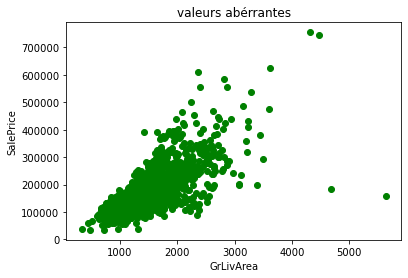

In [5]:
# Looking for outliers, as indicated in https://ww2.amstat.org/publications/jse/v19n3/decock.pdf
plt.scatter(train.GrLivArea, train.SalePrice, c = "green")
plt.title("valeurs abérrantes")
plt.xlabel("GrLivArea")
plt.ylabel("SalePrice")
plt.show()


# ANALYSE

on effectue le partitionnement suivant: 

In [25]:
train_cat=train[['MSZoning', 'LandContour', 'LotConfig', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 
                 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st','Exterior2nd', 'MasVnrType',  'Foundation',
                 'Heating',  'CentralAir','Functional', 'GarageType',  'MiscFeature','SaleType','Fence', 
                 'SaleCondition','Electrical']]

In [26]:
train_num=train[[ 'LotFrontage', 'LotArea', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2',
       'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF','GrLivArea', 'BsmtFullBath','BsmtHalfBath', 
        'FullBath', 'HalfBath','BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces','GarageYrBlt', 'GarageCars',
        'GarageArea', 'WoodDeckSF', 'OpenPorchSF','EnclosedPorch', '3SsnPorch', 'ScreenPorch','MoSold', 'YrSold','SalePrice']]

In [27]:
Garage_columns= ['GarageType','GarageFinish','GarageQual','GarageCond', 'GarageCars','GarageArea','GarageYrBlt' ]
sous_sol_columns = ['BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'BsmtFinSF1', 'BsmtFinSF2',
                    'BsmtUnfSF', 'TotalBsmtSF','BsmtFullBath', 'BsmtHalfBath']

In [28]:
train_ord_cat =train[['ExterQual','ExterCond','BsmtQual','BsmtCond','BsmtExposure',
                      'BsmtFinType1','BsmtFinType2','HeatingQC','GarageQual','GarageCond','FireplaceQu']]

In [29]:
train_ord =train[['MSSubClass','OverallQual','OverallCond', 'LotShape','Street', 'Alley','Utilities','LandSlope',  'ExterQual','ExterCond',
                      'BsmtQual','BsmtCond','BsmtExposure', 'BsmtFinType1','BsmtFinType2','HeatingQC', 
                       'KitchenQual','FireplaceQu','GarageFinish', 'GarageQual','PavedDrive','GarageCond','PoolQC']]

#  Analyse univarie

C:\Users\DELL\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\DELL\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\DELL\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level 

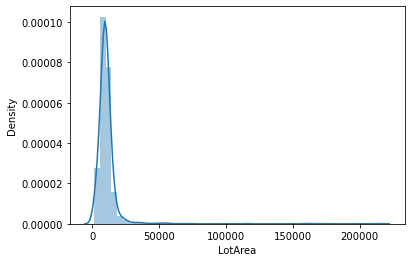

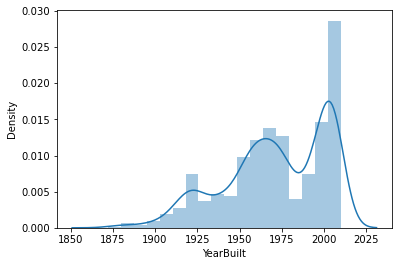

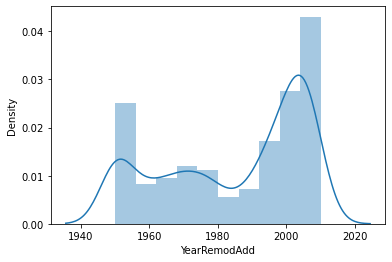

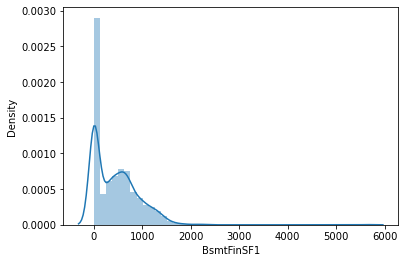

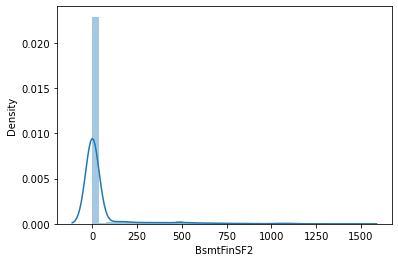

...

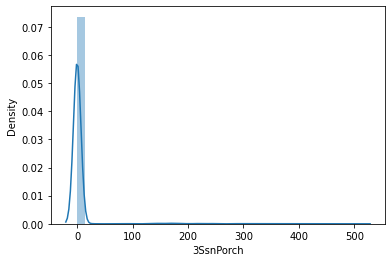

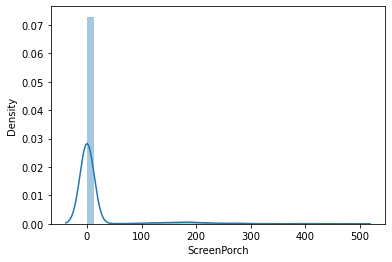

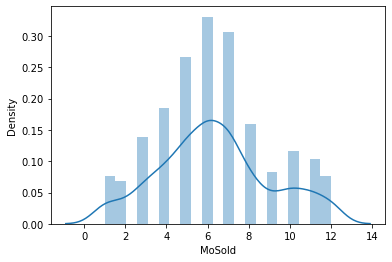

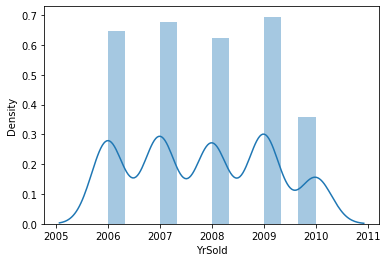

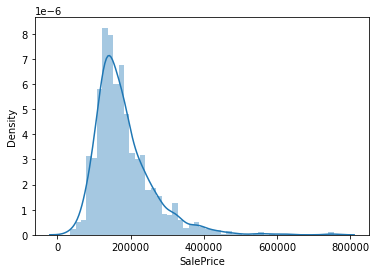

In [13]:
for col in train_num.select_dtypes('int64'):
    plt.figure()
    sns.distplot(train_num[col])

In [28]:
for col in train_cat.select_dtypes('object'):
    print(f'{col :-<50} {train_cat[col].unique()}')

MSZoning------------------------------------------ ['RL' 'RM' 'C (all)' 'FV' 'RH']
Street-------------------------------------------- ['Pave' 'Grvl']
LotShape------------------------------------------ ['Reg' 'IR1' 'IR2' 'IR3']
LandContour--------------------------------------- ['Lvl' 'Bnk' 'Low' 'HLS']
Utilities----------------------------------------- ['AllPub' 'NoSeWa']
LotConfig----------------------------------------- ['Inside' 'FR2' 'Corner' 'CulDSac' 'FR3']
LandSlope----------------------------------------- ['Gtl' 'Mod' 'Sev']
Neighborhood-------------------------------------- ['CollgCr' 'Veenker' 'Crawfor' 'NoRidge' 'Mitchel' 'Somerst' 'NWAmes'
 'OldTown' 'BrkSide' 'Sawyer' 'NridgHt' 'NAmes' 'SawyerW' 'IDOTRR'
 'MeadowV' 'Edwards' 'Timber' 'Gilbert' 'StoneBr' 'ClearCr' 'NPkVill'
 'Blmngtn' 'BrDale' 'SWISU' 'Blueste']
Condition1---------------------------------------- ['Norm' 'Feedr' 'PosN' 'Artery' 'RRAe' 'RRNn' 'RRAn' 'PosA' 'RRNe']
Condition2-----------------------------------

<ipython-input-31-77992ce73823>:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()


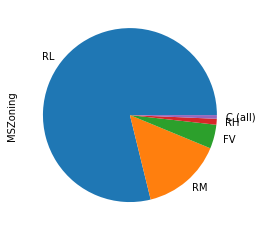

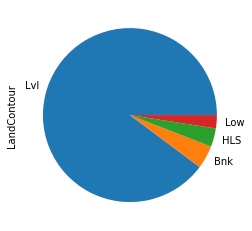

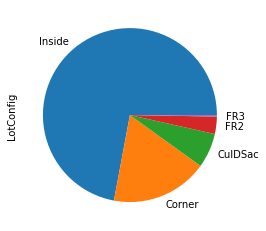

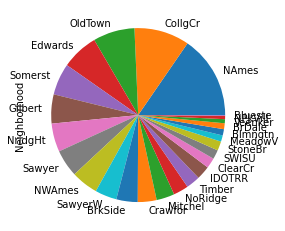

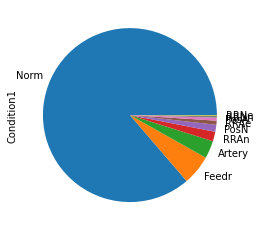

...

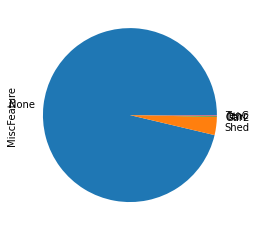

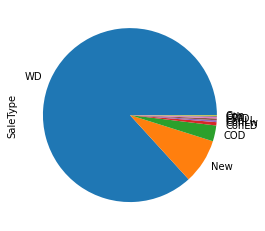

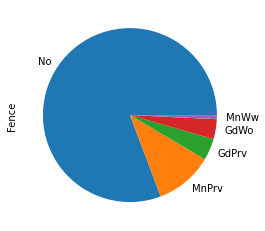

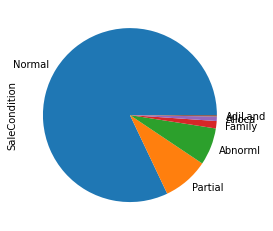

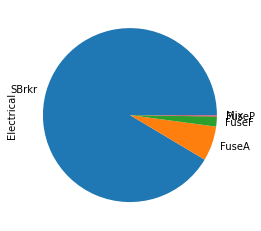

In [31]:
for col in train_cat.select_dtypes('object'):
    plt.figure()
    train_cat[col].value_counts().plot.pie()

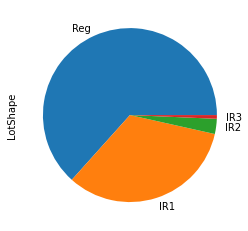

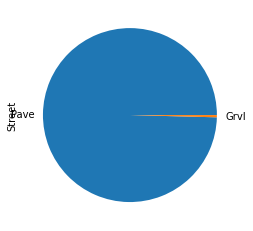

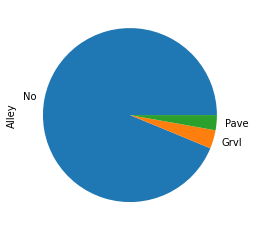

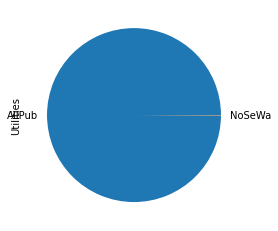

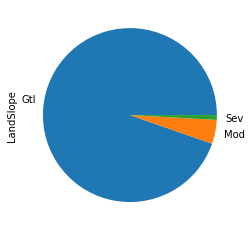

...

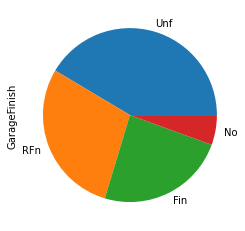

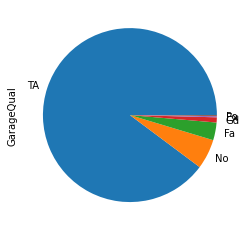

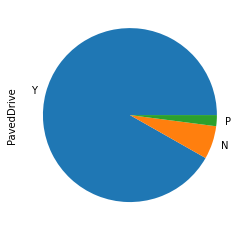

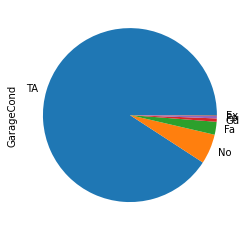

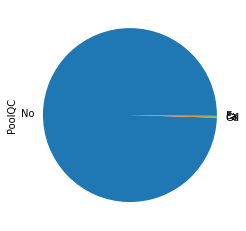

In [15]:
for col in train_ord.select_dtypes('object'):
    plt.figure()
    train_ord[col].value_counts().plot.pie()

### Caracteristiques présantant une variance faibles

<AxesSubplot:ylabel='Alley'>

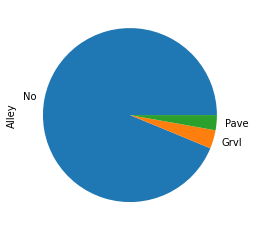

In [33]:
plt.figure()
train_ord['Alley'].value_counts().plot.pie()

<AxesSubplot:ylabel='MiscFeature'>

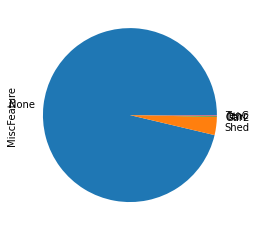

In [34]:
plt.figure()
train_cat['MiscFeature'].value_counts().plot.pie()

<AxesSubplot:ylabel='Fence'>

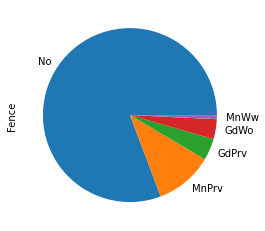

In [35]:
plt.figure()
train_cat['Fence'].value_counts().plot.pie()

<AxesSubplot:ylabel='PoolQC'>

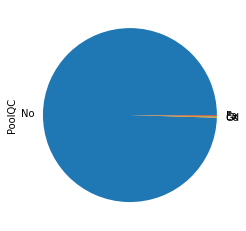

In [37]:
plt.figure()
train_ord['PoolQC'].value_counts().plot.pie()

<AxesSubplot:ylabel='GarageCond'>

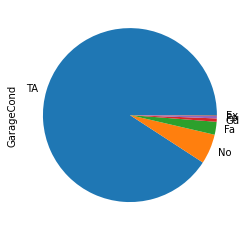

In [38]:
plt.figure()
train_ord['GarageCond'].value_counts().plot.pie()

<AxesSubplot:ylabel='GarageQual'>

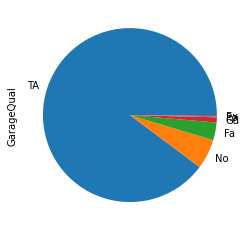

In [39]:
plt.figure()
train_ord['GarageQual'].value_counts().plot.pie()

<AxesSubplot:ylabel='BsmtFinType2'>

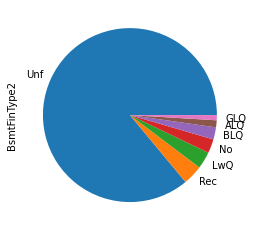

In [40]:
plt.figure()
train_ord['BsmtFinType2'].value_counts().plot.pie()

<AxesSubplot:ylabel='BsmtCond'>

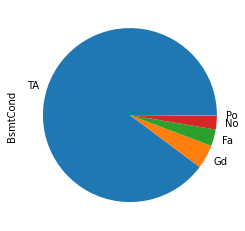

In [41]:
plt.figure()
train_ord['BsmtCond'].value_counts().plot.pie()

<AxesSubplot:ylabel='ExterCond'>

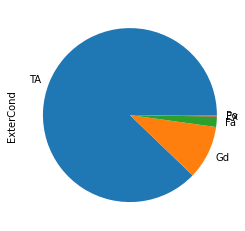

In [42]:
plt.figure()
train_ord['ExterCond'].value_counts().plot.pie()

<AxesSubplot:ylabel='Street'>

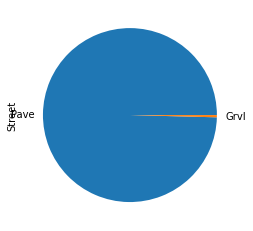

In [44]:
plt.figure()
train_ord['Street'].value_counts().plot.pie()

<AxesSubplot:ylabel='LandContour'>

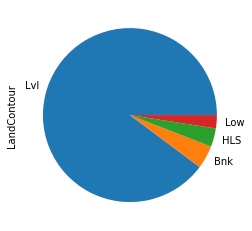

In [45]:
plt.figure()
train_cat['LandContour'].value_counts().plot.pie()


<AxesSubplot:ylabel='Utilities'>

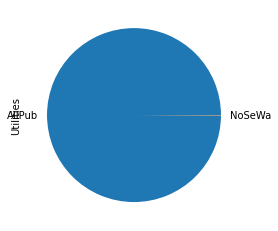

In [47]:
plt.figure()
train_ord['Utilities'].value_counts().plot.pie()


<AxesSubplot:ylabel='Condition1'>

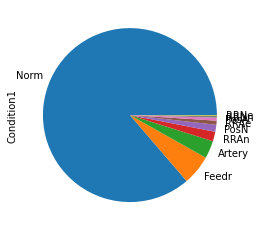

In [48]:
plt.figure()
train_cat['Condition1'].value_counts().plot.pie()


<AxesSubplot:ylabel='Condition2'>

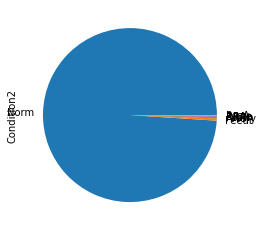

In [52]:
plt.figure()
train_cat['Condition2'].value_counts().plot.pie()

<AxesSubplot:ylabel='RoofMatl'>

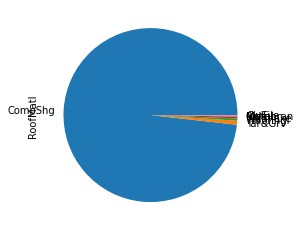

In [53]:
plt.figure()
train_cat['RoofMatl'].value_counts().plot.pie()

<AxesSubplot:ylabel='LandSlope'>

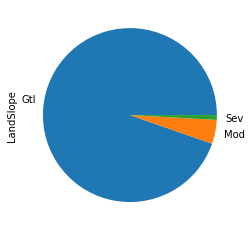

In [55]:
plt.figure()
train_ord['LandSlope'].value_counts().plot.pie()

<AxesSubplot:ylabel='Heating'>

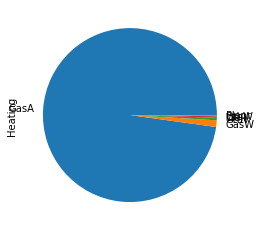

In [56]:
plt.figure()
train_cat['Heating'].value_counts().plot.pie()

<AxesSubplot:ylabel='CentralAir'>

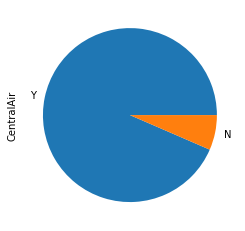

In [57]:
plt.figure()
train_cat['CentralAir'].value_counts().plot.pie()

<AxesSubplot:ylabel='Functional'>

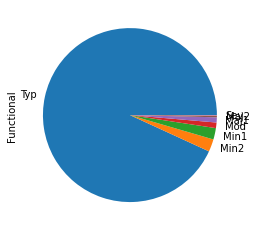

In [58]:
plt.figure()
train_cat['Functional'].value_counts().plot.pie()

<AxesSubplot:ylabel='PavedDrive'>

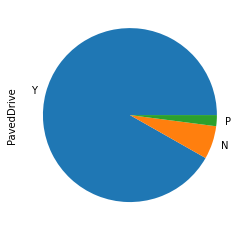

In [60]:
plt.figure()
train_ord['PavedDrive'].value_counts().plot.pie()

<AxesSubplot:ylabel='Electrical'>

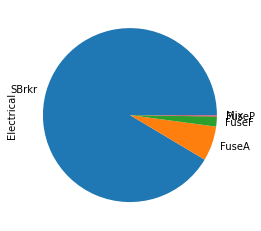

In [61]:
plt.figure()
train_cat['Electrical'].value_counts().plot.pie()

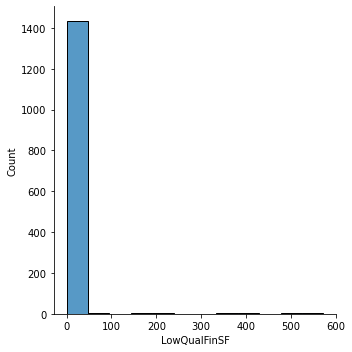

In [62]:
sns.displot(x='LowQualFinSF', data= train_num)

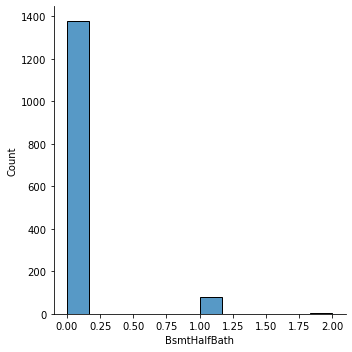

In [63]:
sns.displot(x='BsmtHalfBath', data= train_num)


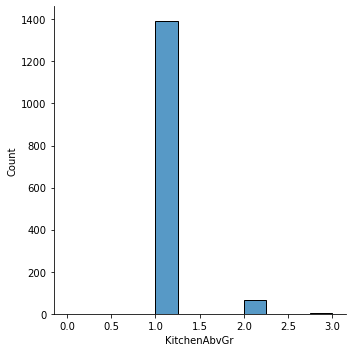

In [65]:
sns.displot(x='KitchenAbvGr', data= train_num)

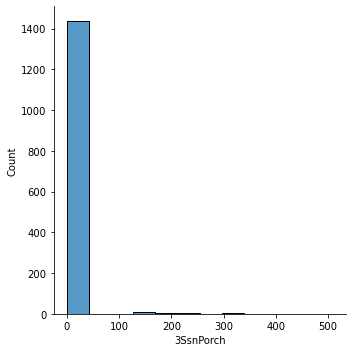

In [66]:
sns.displot(x='3SsnPorch', data= train_num)

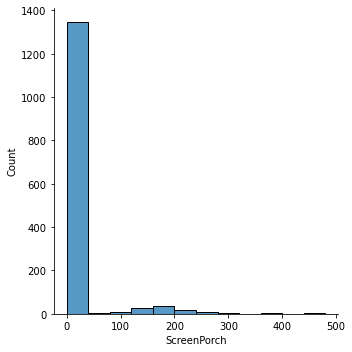

In [67]:
sns.displot(x='ScreenPorch', data= train_num)

## Presentation de la variable a predire

La variable à prédire Y est constituée de valeurs discrètes, en particulier des entiers stictement positifs.
Du tableau descriptif de la variable, nous pouvons observer les écarts entre les  différents indicateurs qui traduit une fois de plus la présence de valeurs abérrantes.
Le documment https://ww2.amstat.org/publications/jse/v19n3/decock.pdf suggère de supprimer ces maisons
 La courbe de la distribution des prix des maison ressemble fortement à celles d'une loi de poisson tandis que la courbe de la distribution du logarithme des prix ressemble plutôt à une loi de normale. ce qui semble suggéré un modèle de regréssion de poisson comme candidat idéal pour la prédiction des prix ou une transformation logarithmique pour la construction d'un modèle linéaire performant.

In [68]:
Y=train['SalePrice']


In [29]:
Y.describe()

count      1460.000000
mean     180921.195890
std       79442.502883
min       34900.000000
25%      129975.000000
50%      163000.000000
75%      214000.000000
max      755000.000000
Name: SalePrice, dtype: float64

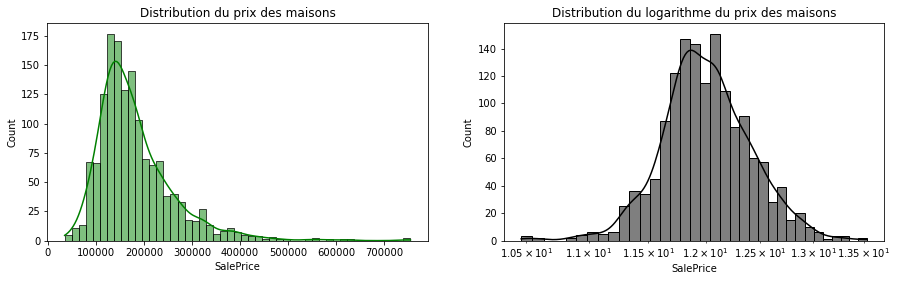

In [59]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 4))

sns.histplot(Y, color='g', kde=True, ax=axes[0])
axes[0].set_title('Distribution du prix des maisons')

log_y = np.log(Y)

sns.histplot(log_y, color='black', kde=True, ax=axes[1])
axes[1].set_title('Distribution du logarithme du prix des maisons')
axes[1].set_xscale('log');

# ANALYSE MULTIVARIEE

In [103]:
train_ord_sale =train[['MSSubClass','OverallQual','OverallCond', 'LotShape','Street', 'Alley','Utilities','LandSlope',  'ExterQual','ExterCond',
                      'BsmtQual','BsmtCond','BsmtExposure', 'BsmtFinType1','BsmtFinType2','HeatingQC', 
                       'KitchenQual','FireplaceQu','GarageFinish', 'GarageQual','PavedDrive','GarageCond','PoolQC','SalePrice']]

In [104]:
Rapport1=ProfileReport(train_ord_sale,
                        title="train_ord_sale",
        
                                    )
Rapport1

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

D'après les différents indicateurs ( coefficient de rang de Spearman, pearson et Kendall), il existe une liaison linéaire positive forte entre le prix des maisons et la qualité générale.

le coefficient de Cramer permet d'apprecier la liaison entre deux variables caatégorielles. De l'observation du heatmap du coefficient de cramer, il ressort que :
 
         - BsmFinType1 est fortement lié avec les variables BsmtQual,BsmtCond,BsmtFinType2
         - OverallQual, l'etat général des materiaux de la maison est fortement corrélé avec la qualité des materiaux de la façade extérieure (ExterQual), la hauteur (BsmtQual) et l'état général de sous-sol (BsmtCond), Qualité et état du chauffage (HeatingQC), la Finition intérieure du garage (GarageFinish) et la qualité de la cuisine (KitchenQual)
         - 
le rapport de corrélation permet d'apprécier la liaison entre une variable qualitative et une variable numérique. c'est lui qui permet d'apprecier le lien entre la variable SalePrice et les autres variables.
ainsi il existe une liaison forte entre la variable Saleprice et les variables ExterQual, BsmtQual, HeatingQC, OverallQual,GarageFinish, KitchenQual,Neighborhood et centralAir. 

In [105]:
train_cat_sale=train[['MSZoning', 'LandContour', 'LotConfig', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 
                 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st','Exterior2nd', 'MasVnrType',  'Foundation',
                 'Heating',  'CentralAir','Functional', 'GarageType',  'MiscFeature','SaleType','Fence', 
                 'SaleCondition','Electrical','SalePrice']]

In [100]:
Rapport2=ProfileReport(train_cat_sale,
                        title="train_cat_sale",
        
                                    )
Rapport2

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

 La classification générale de zonage (MSZoning), le type de logement (BldgType), le type de garage (GarageType), la fondation (Foundation), le type de maison (BldgType) et le prix du logement quartier sont liés au quartier ( Neighborhood).
 il existe une liaison linéaire forte entre les variables SalePrice,Neighborhood et centralAir 

### Corrélation

La variable salePrice est fortement correlé avec 10 variables : YearBuilt, MasVnrArea, BsmtFinSF11stFlrSF, 2ndFlrSF,GrLivArea, FullBath,TotRmsAbvGrd,GarageCars,GarageArea

En dehors de la variable OpenPorchSF, les autres types de porche n'influence pas la maison, il en est de même pour le mois et l'année de vente. leurs évolutions semblent être indépendant des autres variables.

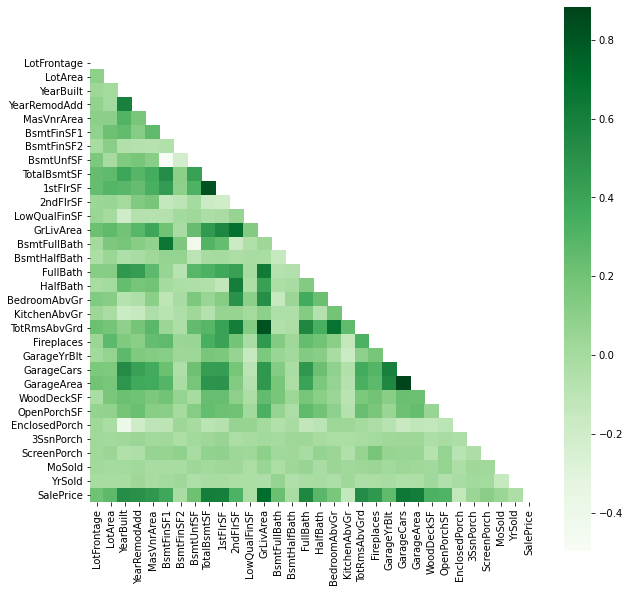

In [70]:
plt.figure(figsize=(10, 10))
corr= train_num.corr()
mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask)] = True

sns.heatmap(train_num.corr(), cmap='Greens',square=True, mask=mask, cbar=True);

In [71]:
traincorr = train.corr()['SalePrice']
traincorr = pd.DataFrame(traincorr)
traincorr.columns = ["Correlation"]
# sort correlation
traincorr = traincorr.sort_values(by=['Correlation'], ascending=False)
print(traincorr)

               Correlation
SalePrice         1.000000
OverallQual       0.790982
GrLivArea         0.708624
GarageCars        0.640409
GarageArea        0.623431
TotalBsmtSF       0.613581
1stFlrSF          0.605852
FullBath          0.560664
TotRmsAbvGrd      0.533723
YearBuilt         0.522897
YearRemodAdd      0.507101
MasVnrArea        0.472614
Fireplaces        0.466929
BsmtFinSF1        0.386420
WoodDeckSF        0.324413
2ndFlrSF          0.319334
OpenPorchSF       0.315856
HalfBath          0.284108
LotArea           0.263843
GarageYrBlt       0.261366
BsmtFullBath      0.227122
BsmtUnfSF         0.214479
LotFrontage       0.209624
BedroomAbvGr      0.168213
ScreenPorch       0.111447
PoolArea          0.092404
MoSold            0.046432
3SsnPorch         0.044584
BsmtFinSF2       -0.011378
BsmtHalfBath     -0.016844
MiscVal          -0.021190
LowQualFinSF     -0.025606
YrSold           -0.028923
OverallCond      -0.077856
MSSubClass       -0.084284
EnclosedPorch    -0.128578
K

### Evolution du prix des maisons en fonction des variables temporelles

chaque années, le nombre total de maisons vendu oscille autours de 300 et la médiane des prix oscille autours de 160000 lorsqu'on évalue sur tous les mois.
Nous remarquons que les ventes sont plus élevées durant les mois de juin et juillet et sont généralement plus faible entre janvier et février.

In [74]:
train[['SalePrice','YrSold','MoSold']].groupby(['YrSold','MoSold']).count()

SalePrice
YrSold MoSold           
2006   1              10
       2               9
       3              25
       4              27
       5              38
       6              48
       7              67
       8              23
       9              15
       10             24
       11             16
       12             12
2007   1              13
       2               8
       3              23
       4              23
       5              43
       6              59
       7              51
       8              40
       9              11
       10             16
       11             24
       12             18
2008   1              13
       2              10
       3              18
       4              26
       5              38
       6              51
       7              49
       8              29
       9              17
       10             22
       11             17
       12             14
2009   1              12
       2              10
       3              19
       4              26
       5              37
       6              59
       7              61
       8              30
       9              20
       10             27
       11             22
       12             15
2010   1              10
       2              15
       3              21
       4              39
       5              48
       6              36
       7               6

<AxesSubplot:xlabel='YrSold,MoSold'>

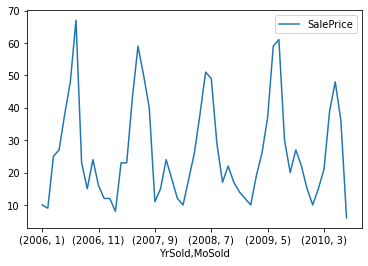

In [60]:
train[['SalePrice','YrSold','MoSold']].groupby(['YrSold','MoSold']).count().plot()

In [61]:
train[['SalePrice','YrSold']].groupby(['YrSold']).count()

,SalePrice
YrSold,
2006,314
2007,326
2008,303
2009,338
2010,175


In [62]:
train[['SalePrice','YrSold']].groupby(['YrSold']).median()

,SalePrice
YrSold,
2006,163995
2007,165000
2008,165000
2009,162000
2010,155000


### influence de l'âge sur le prix des maisons

Nous pouvons observer sur ces graphiques la décroissance du prix des maisons avec l'age. plus l'âge de la maisons est élévé lors de la vente, plus son prix est faible.

In [88]:
train['Age']

0        5
1       31
2        7
3       91
4        8
        ..
1455     8
1456    32
1457    69
1458    60
1459    43
Name: Age, Length: 1460, dtype: int64

<Figure size 432x288 with 0 Axes>

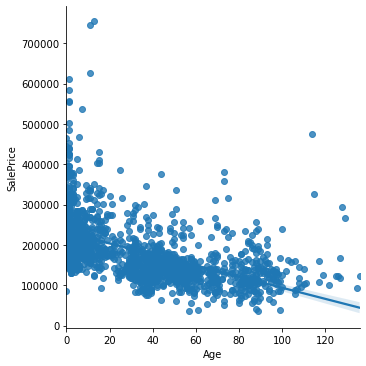

In [93]:
plt.figure()
sns.lmplot(x='Age', y='SalePrice', data=train)

<Figure size 432x288 with 0 Axes>

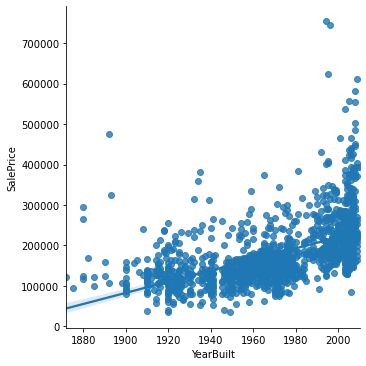

In [90]:
plt.figure()
sns.lmplot(x='YearBuilt', y='SalePrice', data=train)

#### Impact de la rénovation, du quartier et du type de maisons


Toutes les maisons de plus de 60 ans ont été rénové.
Les rénovations sont plus nombreuses dans les villes où les maisons sont les plus agés
La rénovation semble ne pas avoir beaucoup d'impact sur le prix de la maison , mais plutôt l'age. Car les quartiers où les maisons sont moins agés ont des prix plus élevés (Blmgtn, Nridght, Somerst, Noridge,Stonebr) que les quartiers où les maisons sont les plus agés même s'il y a eu rénovation (Swisu, Eduard,IDOTRR,Sawyer, Brkside, Oldtown, Crowford). Ceci peut être dû à l'ancienneté du type de maisons.

<AxesSubplot:xlabel='Age', ylabel='SalePrice'>

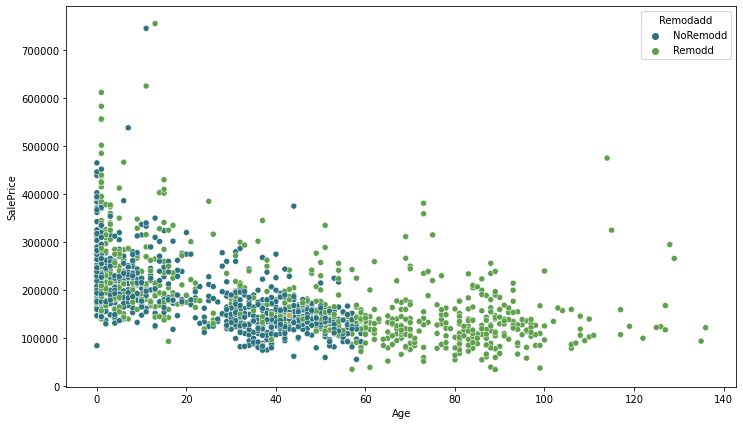

In [97]:
plt.figure(figsize=(12, 7))
sns.scatterplot(x='Age', y='SalePrice', data=train, palette='gist_earth', hue='Remodadd')

C:\Users\DELL\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\DELL\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\DELL\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level 

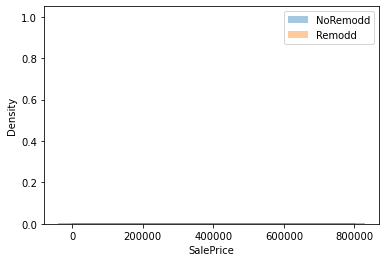

In [103]:
for cat in train['Remodadd'].unique():
        sns.distplot(train[train['Remodadd']==cat]['SalePrice'], label=cat)
        plt.legend()

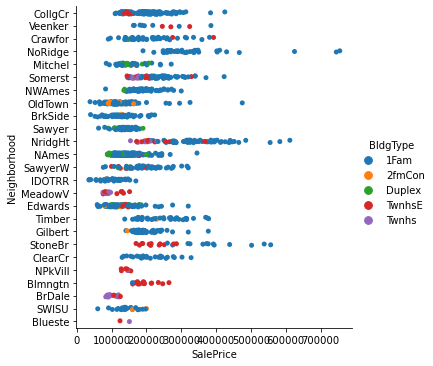

In [102]:
sns.catplot(x='SalePrice', y='Neighborhood',data= train, hue = 'BldgType')

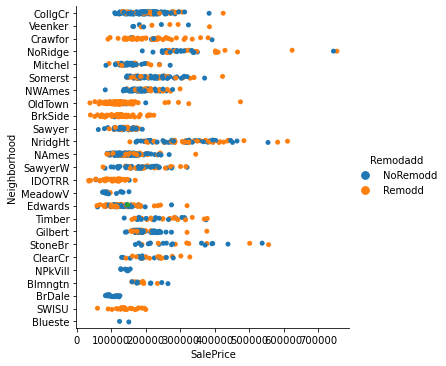

In [101]:
sns.catplot(x='SalePrice', y='Neighborhood',data= train, hue = 'Remodadd')

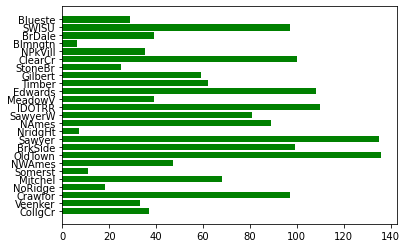

In [150]:
x=train['Neighborhood']
y=train['Age']
plt.barh(x,y, color= 'green')
plt.show()

### impact du quartier et de la zone d'habitation

Le prix des maisons varie considérablement avec la zone d'habitation. Les Residential Low Density (RL) ont plus de maisons et regorgent presque tous les types de logements pour tous les niveaux de prix. Les zones commerciales ont moins de maisons qui sont pour la plupart de type 1Fam et ont généralement les prix faibles. 

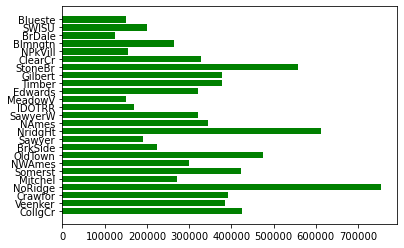

In [105]:
x=train['Neighborhood']
y=train['SalePrice']
plt.barh(x,y, color= 'green')
plt.show()

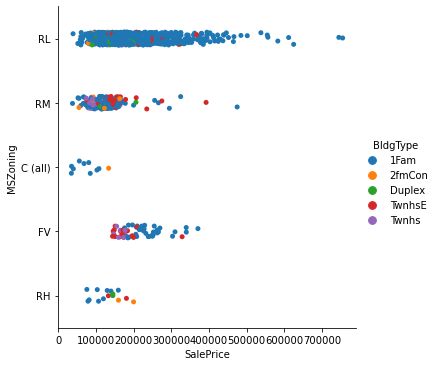

In [104]:
sns.catplot(x='SalePrice', y='MSZoning',data= train, hue = 'BldgType')

### Impact de la grandeur

#### La surface

Le prix des maisons croit avec la surface habitable au-dessus du niveau du sol (GrLivArea). La distribution de la surface habitable et du prix des maisons en fonction de la surface de propieté (LotArea) semble être la même.
Toutefois, on note aussi l'existence d'une relation linéaire forte entre ces variables et la variable à prédire.
on peut aussi remarquer la faible variation de la surface habitable avec la surface de la proprieté.

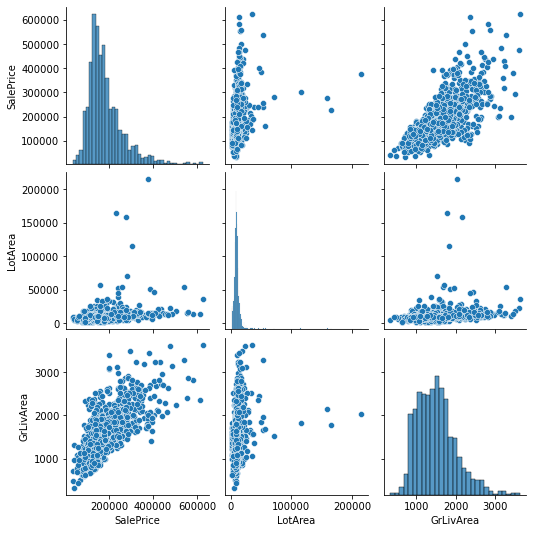

In [78]:
sns.pairplot(train[['SalePrice','LotArea','GrLivArea']])

<Figure size 432x288 with 0 Axes>

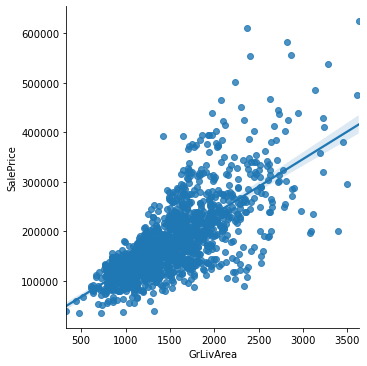

In [79]:
plt.figure()
sns.lmplot(x='GrLivArea', y='SalePrice', data=train)

<Figure size 432x288 with 0 Axes>

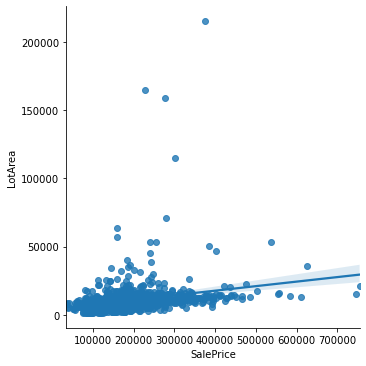

In [106]:
plt.figure()
sns.lmplot(x='SalePrice', y='LotArea', data=train)

## La MAISON

### l' exterieur

La qualité des matériaux extérieurs influence positivement le prix des maisons. pour la plupart des maisons, les materiaux sont moyennement biens leur état oscille entre typique et bien.
le type de fondation semble être un facteur discriminant du prix des maisons

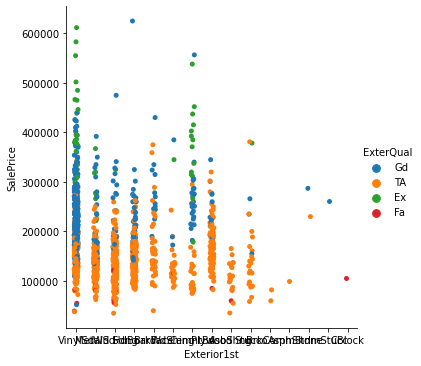

In [81]:
sns.catplot(x='Exterior1st', y='SalePrice',data= train, hue= 'ExterQual')

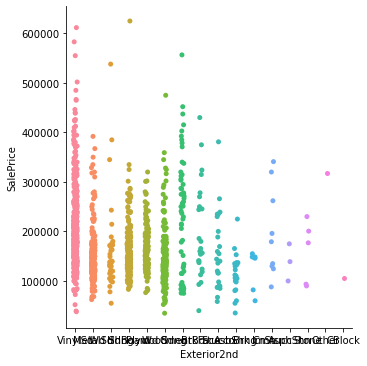

In [82]:
sns.catplot(x='Exterior2nd', y='SalePrice',data= train)

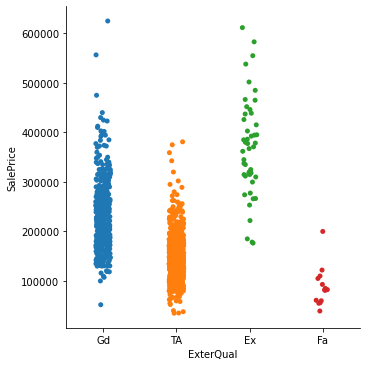

In [83]:
sns.catplot(x='ExterQual', y='SalePrice',data= train)

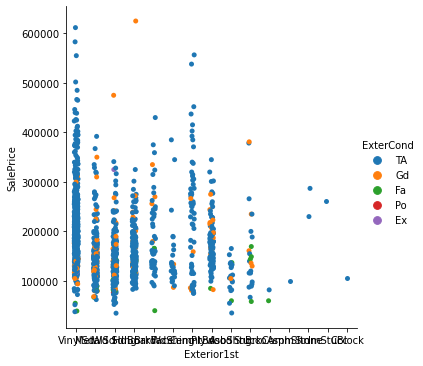

In [84]:
sns.catplot(x='Exterior1st', y='SalePrice',data= train, hue= 'ExterCond')

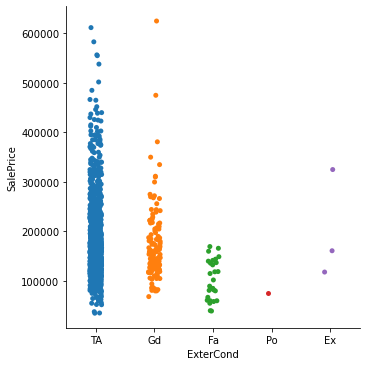

In [85]:
sns.catplot(x='ExterCond', y='SalePrice',data= train)

####  Le type de plaçage de  maçonnerie

Les types de placages Stone et BrkFace sont les plus utilisés. 
L'mpact de la qualité du plaçage de la maçonnerie et le type de plaçage sur le prix des maisons n'est pas facilement observable. Le type de fondation Pconc est le plus utisé.

<AxesSubplot:xlabel='MasVnrArea', ylabel='SalePrice'>

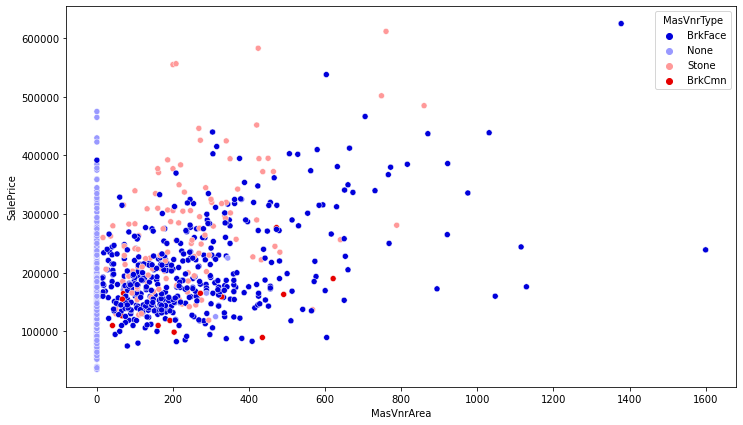

In [86]:
plt.figure(figsize=(12, 7))
sns.scatterplot(x='MasVnrArea', y='SalePrice', data=train, palette='seismic', hue='MasVnrType',)

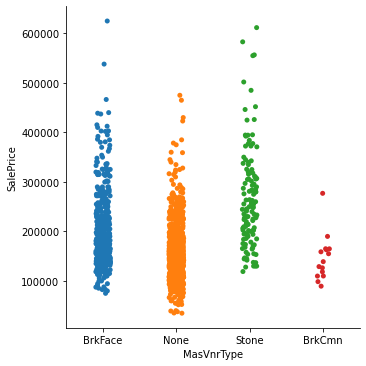

In [87]:
sns.catplot(x='MasVnrType', y='SalePrice',data= train)

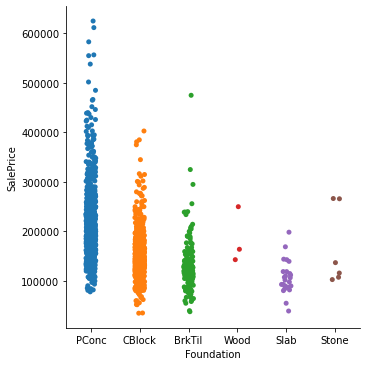

In [88]:
sns.catplot(x='Foundation', y='SalePrice',data= train)

#### Le nombre de piece

Le prix des propietés croit avec le nombre de pièces dans la maisons.
Le prix des maisons croix avec le nombre de salle de bain complète et ne semble pas lié aux démi salle de bain. Notons que la majeure partie des maisons n'ont pas de démi salle de bain et ont 2 salles de bains complètes.

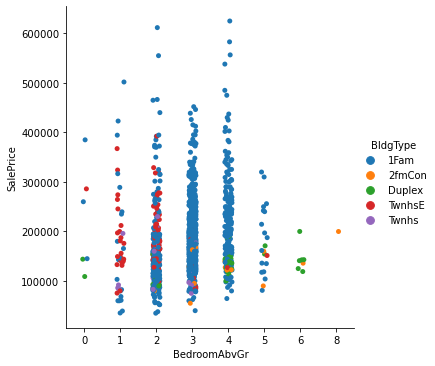

In [89]:
sns.catplot(x='BedroomAbvGr', y='SalePrice',data= train, hue = 'BldgType')

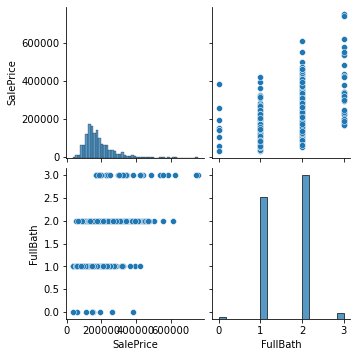

In [116]:
sns.pairplot(train[['SalePrice','FullBath']])

In [115]:
pd.crosstab(train.FullBath, train.BedroomAbvGr)

BedroomAbvGr,0,1,2,3,4,5,6,8
FullBath,,,,,,,,
0,5,2,2,0,0,0,0,0
1,1,42,213,352,37,5,0,0
2,0,6,143,443,156,12,7,1
3,0,0,0,9,20,4,0,0


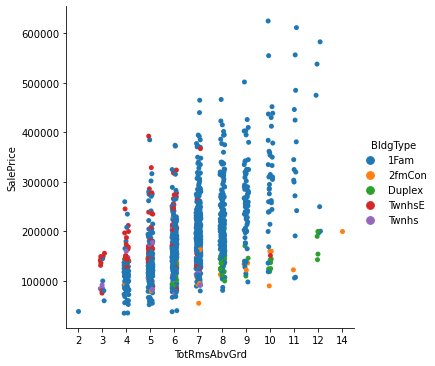

In [91]:
sns.catplot(x='TotRmsAbvGrd', y='SalePrice',data= train, hue = 'BldgType')

###  qualité et de la conditiion des materiaux de la maison

Le prix des maisons croit avec la Qualité globale des matériaux et de la finition (OverallQual). La Qualité globale des matériaux et de la finition semble ne pas être liée à l'Évaluation de l'état général, il en est de même pour le prix.

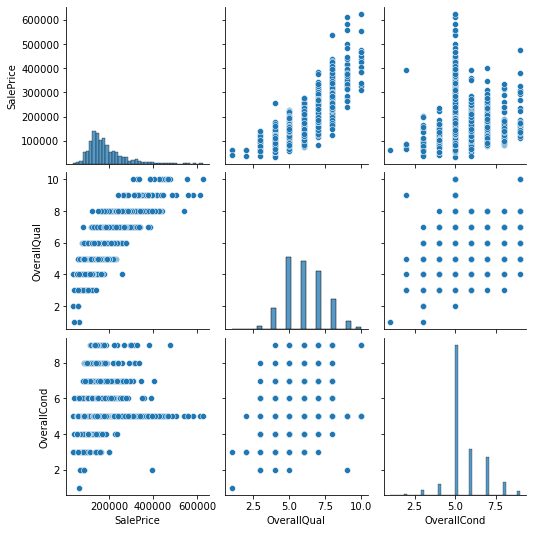

In [92]:
sns.pairplot(train[['SalePrice','OverallQual','OverallCond']])

### le grenier

La plupart des maisons ont des grenier en Gable ou Hip, toutefois les maisons ayant le greniers en Hip semble avoir un prix plu élevé.

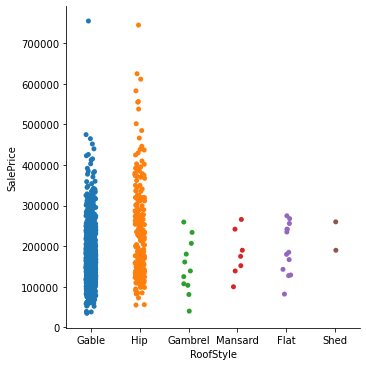

In [120]:
sns.catplot(x='RoofStyle', y='SalePrice',data= train)

<AxesSubplot:ylabel='RoofMatl'>

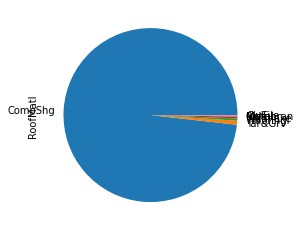

In [131]:
train['RoofMatl'].value_counts().plot.pie()

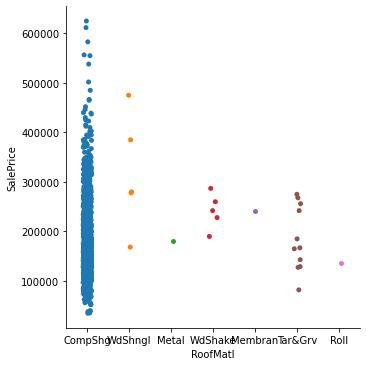

In [95]:
sns.catplot(x='RoofMatl', y='SalePrice',data= train)

###  Les foyers

La qualité de la cuisine semble beaucoup influencer le prix des maisons. 

<AxesSubplot:xlabel='KitchenAbvGr', ylabel='SalePrice'>

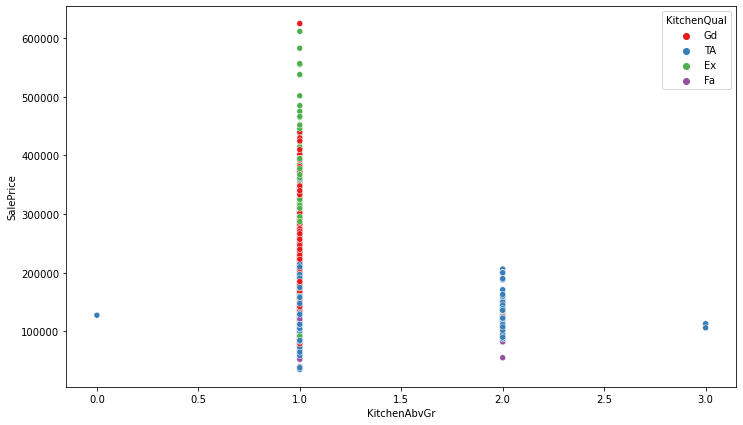

In [104]:
plt.figure(figsize=(12, 7))
sns.scatterplot(x='KitchenAbvGr', y='SalePrice', data=train, palette='Set1', hue='KitchenQual')


<AxesSubplot:xlabel='Fireplaces', ylabel='SalePrice'>

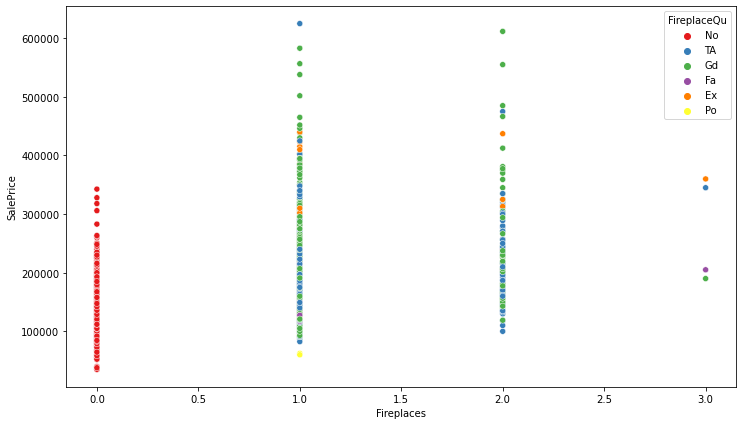

In [105]:
plt.figure(figsize=(12, 7))
sns.scatterplot(x='Fireplaces', y='SalePrice', data=train, palette='Set1', hue='FireplaceQu')

###  Le garage

 Le prix de la maison croit avec la surface du garage..
 La qualité du garage semble ne pas influencer le prix de la propriété contrairement à l'état de ce dernier.

In [106]:
Garage_columns= ['GarageType','GarageFinish','GarageQual','GarageCond', 'GarageCars','GarageArea','GarageYrBlt' ]

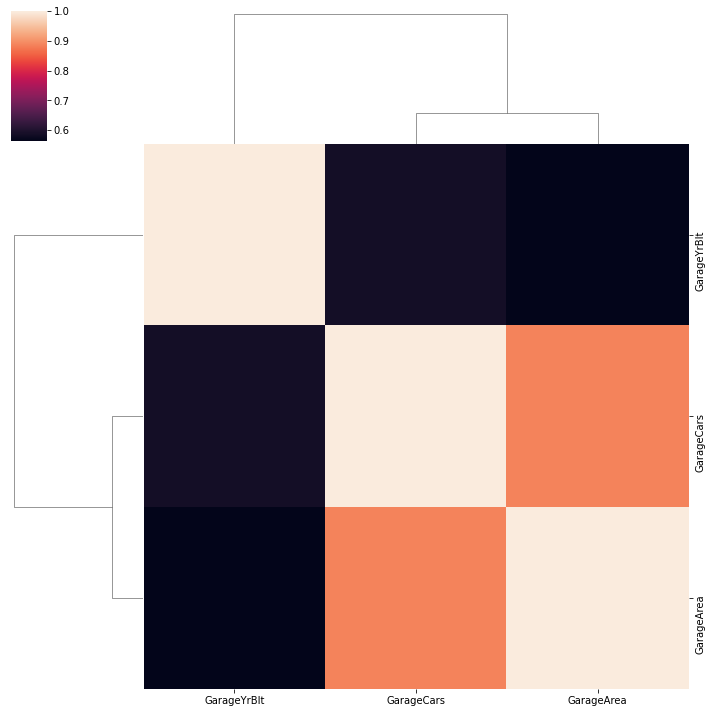

In [107]:
sns.clustermap(train[Garage_columns].corr())

<Figure size 432x288 with 0 Axes>

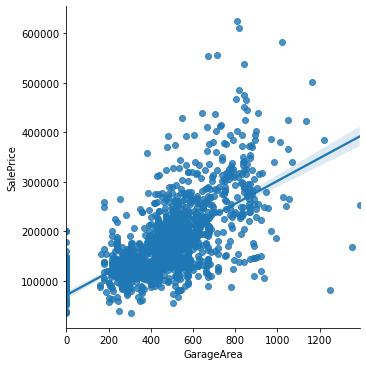

In [108]:
plt.figure()
sns.lmplot(x='GarageArea', y='SalePrice', data=train)

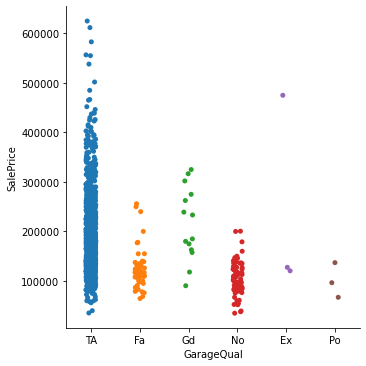

In [109]:
sns.catplot(x='GarageQual', y='SalePrice',data= train)

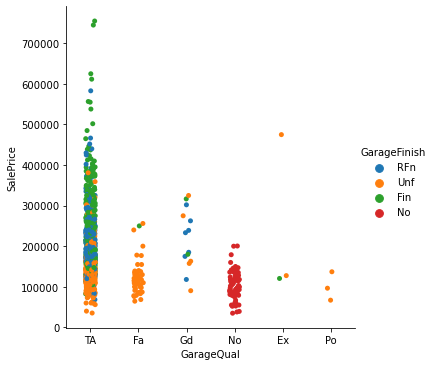

In [133]:
sns.catplot(x='GarageQual', y='SalePrice',data= train, hue = 'GarageFinish')

### Le sous-sol

Les maisons les plus couteuses ont un sous-sol de plus de 3 mètres de hauteur.
Le prix de la maison croit avec la surface totale du sous-sol.
Il semble exister une relation linéaire entre la surface totale du sous-sol et la surface non finies
L'évolution de la variables BsmtFinSF1 est similaire à celle de la variable BsmtFullBath, la même situation est présente entre les variables BsmtFinSF2 et BsmtHalfBath.

In [111]:
sous_sol_columns = ['BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'BsmtFinSF1', 'BsmtFinSF2',
                    'BsmtUnfSF', 'TotalBsmtSF','BsmtFullBath', 'BsmtHalfBath']
sous_sol=['BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'BsmtFullBath', 'BsmtHalfBath'
         , 'BsmtFinSF1', 'BsmtFinSF2',
       'BsmtUnfSF', 'TotalBsmtSF','SalePrice']

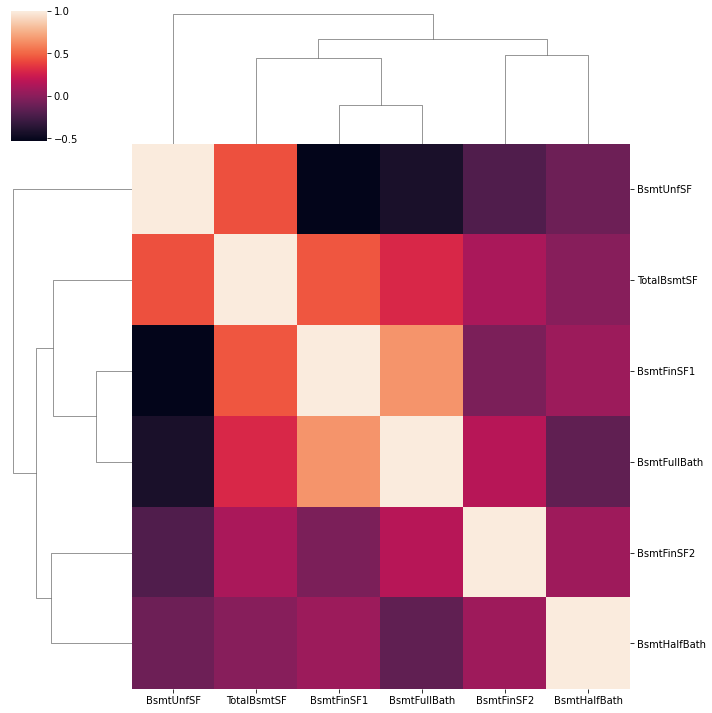

In [112]:
sns.clustermap(train[sous_sol_columns].corr())

<Figure size 432x288 with 0 Axes>

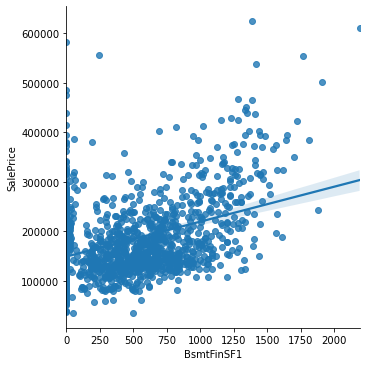

<Figure size 432x288 with 0 Axes>

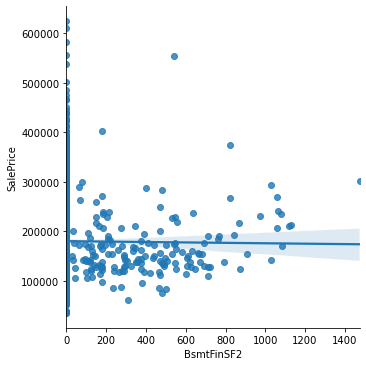

<Figure size 432x288 with 0 Axes>

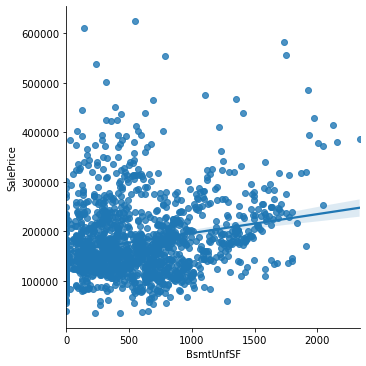

<Figure size 432x288 with 0 Axes>

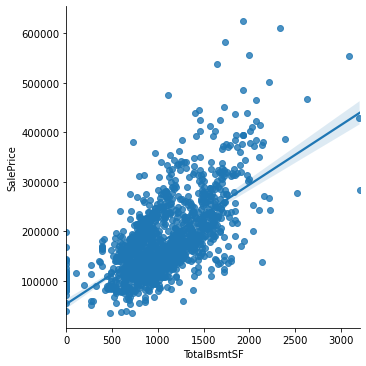

In [113]:
for col in ('BsmtFinSF1','BsmtFinSF2','BsmtUnfSF','TotalBsmtSF'):
    plt.figure()
    sns.lmplot(x=col, y='SalePrice', data=train)

<AxesSubplot:xlabel='BsmtQual', ylabel='SalePrice'>

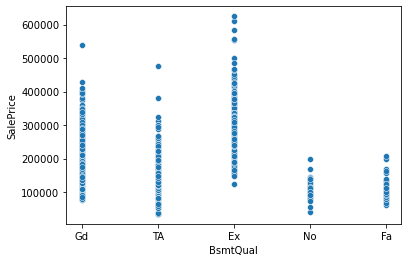

In [114]:
sns.scatterplot(x=train['BsmtQual'], y=train['SalePrice'])

<AxesSubplot:xlabel='BsmtCond', ylabel='SalePrice'>

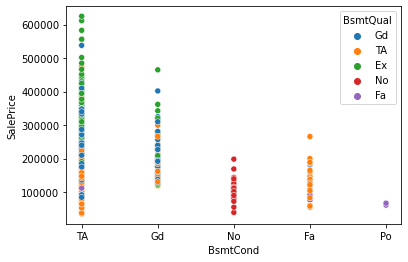

In [115]:
sns.scatterplot(x=train['BsmtCond'], y=train['SalePrice'], data=train,hue='BsmtQual')

<AxesSubplot:xlabel='BsmtFinSF1', ylabel='SalePrice'>

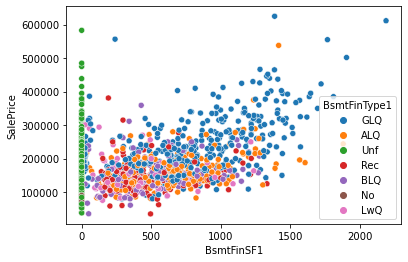

In [116]:
sns.scatterplot(x=train['BsmtFinSF1'], y=train['SalePrice'], data=train,hue='BsmtFinType1')

<AxesSubplot:xlabel='BsmtExposure', ylabel='SalePrice'>

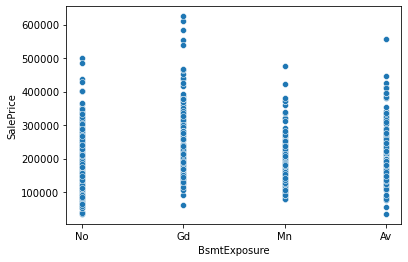

In [117]:
sns.scatterplot(x=train['BsmtExposure'], y=train['SalePrice'])

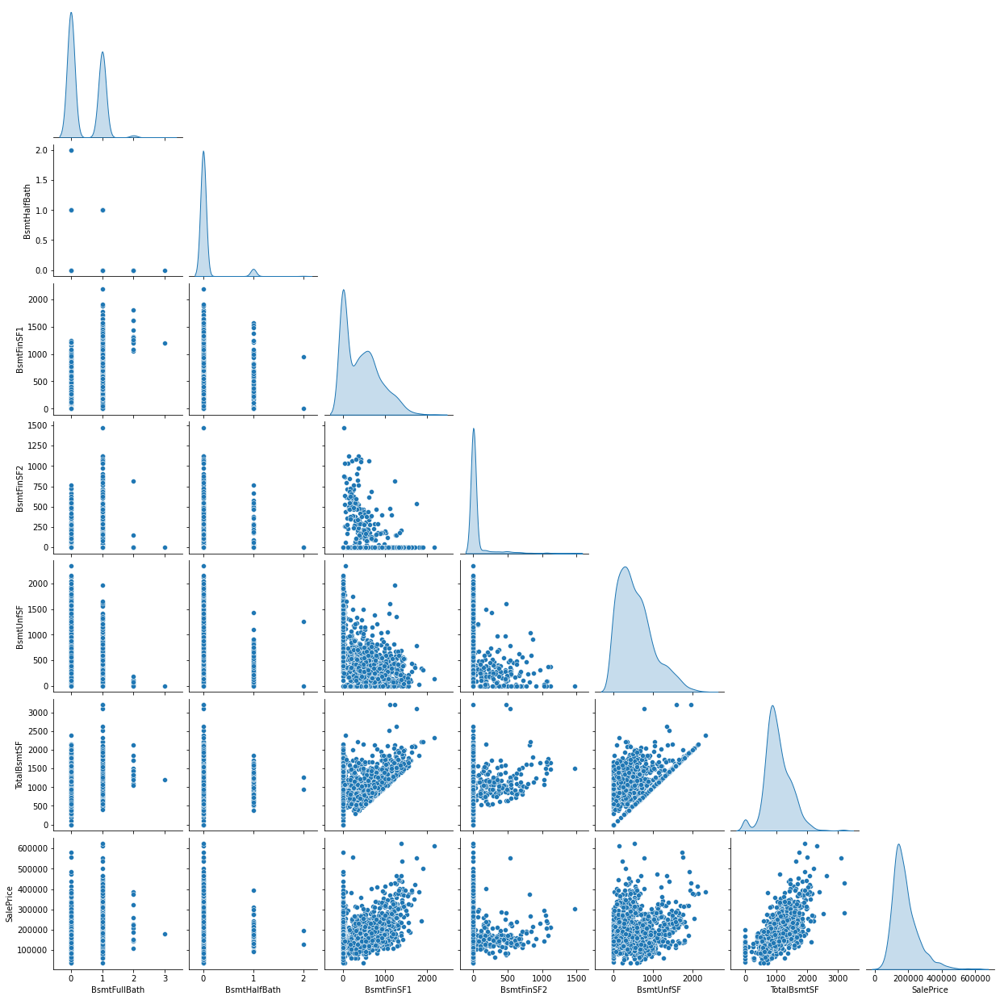

In [118]:
sns.pairplot(train[sous_sol], corner=True, diag_kind="kde")

### La terasse

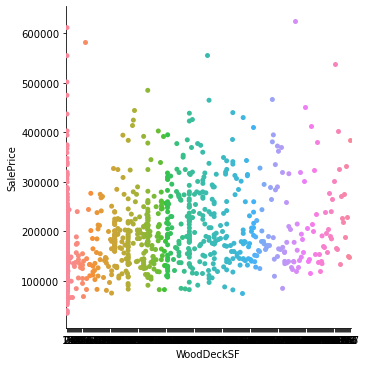

In [119]:
sns.catplot(x='WoodDeckSF', y='SalePrice',data= train)

###  Le porche (veranda)

Le prix des maisons évolu faiblement avec la surface de OpenPorchSF, mais semble être insensible à la surfacede EnclosedPorch,3SsnPorch,ScreenPorch

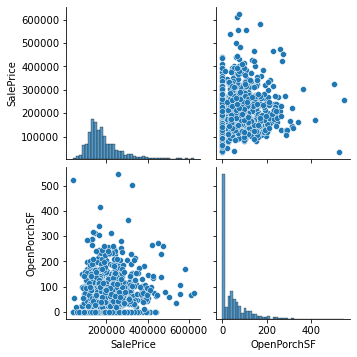

In [120]:
sns.pairplot(train[['SalePrice','OpenPorchSF']]) 

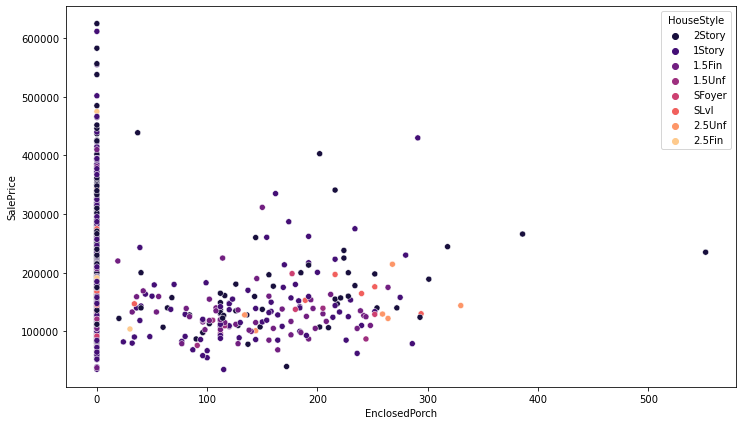

In [121]:
plt.figure(figsize=(12, 7))
sns.scatterplot(x='EnclosedPorch', y='SalePrice', data=train, palette='magma', hue='HouseStyle',);

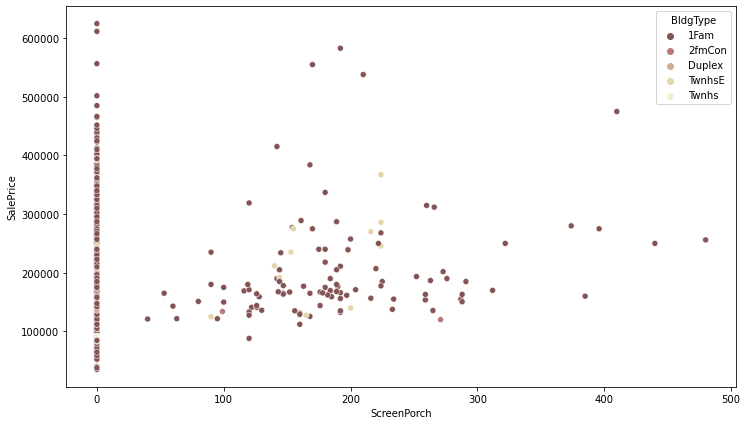

In [122]:
plt.figure(figsize=(12, 7))
sns.scatterplot(x='ScreenPorch', y='SalePrice', data=train, palette='pink', hue='BldgType',);

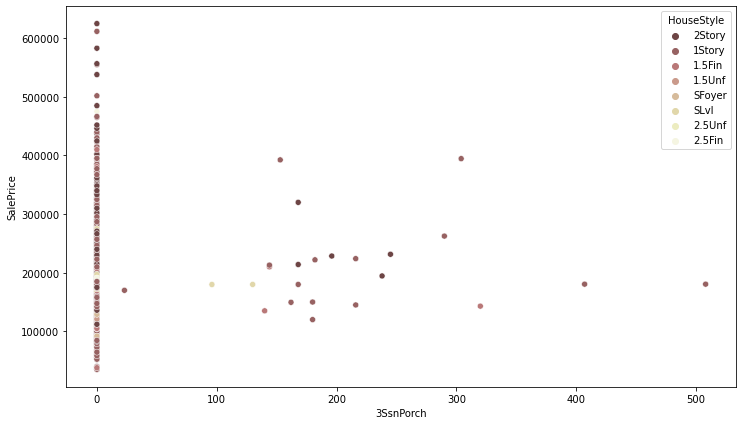

In [123]:
plt.figure(figsize=(12, 7))
sns.scatterplot(x='3SsnPorch', y='SalePrice', data=train, palette='pink', hue='HouseStyle',);

###  Caractéristique de la vente

La plupart des maisons sont  vendues normalement ou anormalement avec une clause de garantie. 
Les nouvelles maisons sont partiellement vendues

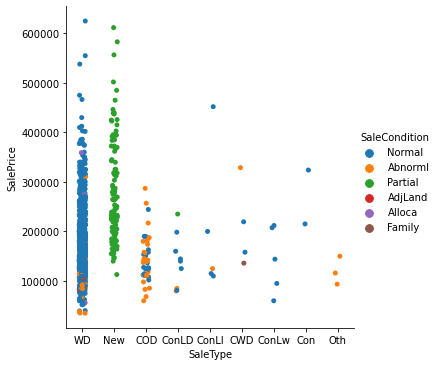

In [124]:
sns.catplot(x='SaleType', y='SalePrice',data= train, hue = 'SaleCondition')

## cas de multicolinearite 

In [134]:
(train_num['TotalBsmtSF'] ==train_num[['BsmtFinSF1','BsmtFinSF2','BsmtUnfSF']].sum(axis=1)).value_counts()

True    1460
dtype: int64

In [135]:
(train_num['GrLivArea'] ==train_num[['1stFlrSF','2ndFlrSF','LowQualFinSF']].sum(axis=1)).value_counts()

True    1460
dtype: int64

# TEST SET

In [137]:
df = pd.read_csv("C:/Users/DELL/Desktop/ISE 2/Machine Learning/test.csv")
df.head(30)

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,1461,20,RH,80.0,11622,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Feedr,Norm,1Fam,1Story,5,6,1961,1961,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,CBlock,TA,TA,No,Rec,468.0,LwQ,144.0,270.0,882.0,GasA,TA,Y,SBrkr,896,0,0,896,0.0,0.0,1,0,2,1,TA,5,Typ,0,NaN,Attchd,1961.0,Unf,1.0,730.0,TA,TA,Y,140,0,0,0,120,0,NaN,MnPrv,NaN,0,6,2010,WD,Normal
1,1462,20,RL,81.0,14267,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,NAmes,Norm,Norm,1Fam,1Story,6,6,1958,1958,Hip,CompShg,Wd Sdng,Wd Sdng,BrkFace,108.0,TA,TA,CBlock,TA,TA,No,ALQ,923.0,Unf,0.0,406.0,1329.0,GasA,TA,Y,SBrkr,1329,0,0,1329,0.0,0.0,1,1,3,1,Gd,6,Typ,0,NaN,Attchd,1958.0,Unf,1.0,312.0,TA,TA,Y,393,36,0,0,0,0,NaN,NaN,Gar2,12500,6,2010,WD,Normal
2,1463,60,RL,74.0,13830,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,5,5,1997,1998,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,PConc,Gd,TA,No,GLQ,791.0,Unf,0.0,137.0,928.0,GasA,Gd,Y,SBrkr,928,701,0,1629,0.0,0.0,2,1,3,1,TA,6,Typ,1,TA,Attchd,1997.0,Fin,2.0,482.0,TA,TA,Y,212,34,0,0,0,0,NaN,MnPrv,NaN,0,3,2010,WD,Normal
3,1464,60,RL,78.0,9978,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,6,6,1998,1998,Gable,CompShg,VinylSd,VinylSd,BrkFace,20.0,TA,TA,PConc,TA,TA,No,GLQ,602.0,Unf,0.0,324.0,926.0,GasA,Ex,Y,SBrkr,926,678,0,1604,0.0,0.0,2,1,3,1,Gd,7,Typ,1,Gd,Attchd,1998.0,Fin,2.0,470.0,TA,TA,Y,360,36,0,0,0,0,NaN,NaN,NaN,0,6,2010,WD,Normal
4,1465,120,RL,43.0,5005,Pave,NaN,IR1,HLS,AllPub,Inside,Gtl,StoneBr,Norm,Norm,TwnhsE,1Story,8,5,1992,1992,Gable,CompShg,HdBoard,HdBoard,None,0.0,Gd,TA,PConc,Gd,TA,No,ALQ,263.0,Unf,0.0,1017.0,1280.0,GasA,Ex,Y,SBrkr,1280,0,0,1280,0.0,0.0,2,0,2,1,Gd,5,Typ,0,NaN,Attchd,1992.0,RFn,2.0,506.0,TA,TA,Y,0,82,0,0,144,0,NaN,NaN,NaN,0,1,2010,WD,Normal
5,1466,60,RL,75.0,10000,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Gilbert,Norm,Norm,1Fam,2Story,6,5,1993,1994,Gable,CompShg,HdBoard,HdBoard,None,0.0,TA,TA,PConc,Gd,TA,No,Unf,0.0,Unf,0.0,763.0,763.0,GasA,Gd,Y,SBrkr,763,892,0,1655,0.0,0.0,2,1,3,1,TA,7,Typ,1,TA,Attchd,1993.0,Fin,2.0,440.0,TA,TA,Y,157,84,0,0,0,0,NaN,NaN,NaN,0,4,2010,WD,Normal
6,1467,20,RL,NaN,7980,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,1Story,6,7,1992,2007,Gable,CompShg,HdBoard,HdBoard,None,0.0,TA,Gd,PConc,Gd,TA,No,ALQ,935.0,Unf,0.0,233.0,1168.0,GasA,Ex,Y,SBrkr,1187,0,0,1187,1.0,0.0,2,0,3,1,TA,6,Typ,0,NaN,Attchd,1992.0,Fin,2.0,420.0,TA,TA,Y,483,21,0,0,0,0,NaN,GdPrv,Shed,500,3,2010,WD,Normal
7,1468,60,RL,63.0,8402,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,6,5,1998,1998,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,PConc,Gd,TA,No,Unf,0.0,Unf,0.0,789.0,789.0,GasA,Gd,Y,SBrkr,789,676,0,1465,0.0,0.0,2,1,3,1,TA,7,Typ,1,Gd,Attchd,1998.0,Fin,2.0,393.0,TA,TA,Y,0,75,0,0,0,0,NaN,NaN,NaN,0,5,2010,WD,Normal
8,1469,20,RL,85.0,10176,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,1Story,7,5,1990,1990,Gable,CompShg,HdBoard,HdBoard,None,0.0,TA,TA,PConc,Gd,TA,Gd,GLQ,637.0,Unf,0.0,663.0,1300.0,GasA,Gd,Y,SBrkr,1341,0,0,1341,1.0,0.0,1,1,2,1,Gd,5,Typ,1,Po,Attchd,1990.0,Unf,2.0,506.0,TA,TA,Y,192,0,0,0,0,0,NaN,NaN,NaN,0,2,2010,WD,Normal
9,1470,20,RL,70.0,8400,Pave,NaN,Reg,Lvl,AllPub,Corner,Gtl,NAmes,Norm,Norm,1Fam,1Story,4,5,1970,1970,Gable,CompShg,

## Présentation générale

Exclue la variable à prédire, nous remarquons qu'il y a autant de variables dans le test set que l'ensemble d'entrainement (train). Toutefois, il y a plus de valeurs manquantes dans le test et un individu en moins. La plupart de ces valeurs manquantes sont dues à la modalité "NA" qui est interprétée comme "NAN". Pour les variables MasVnrType,MasVnrArea ,MSZonin, Functional, BsmtHalfBath, BsmtFullBath, Utilities, KitchenQual, SaleType,BsmtFinSF1, GarageCars, BsmtUnfSF, TotalBsmtSF, Exterior2nd, Exterior1st, GarageArea, BsmtFinSF2, TotRmsAbvGrd, KitchenAbvGr, il s'agit des dommées non renseignées. La modalité "NA" sera recodée en "No" et les valeurs non renséignées seront imputées.

In [138]:
df=df.drop(['Id'], axis= 1)

In [139]:
df.shape

(1459, 79)

<AxesSubplot:ylabel='les differentes categories de variables'>

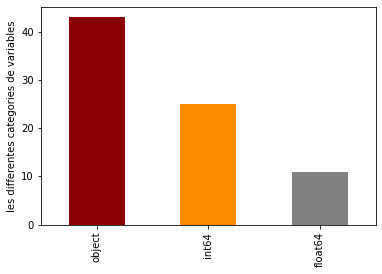

In [140]:
df.dtypes.value_counts().plot.bar(ylabel='les differentes categories de variables', color=['darkred','darkorange','grey'])

In [142]:
categorical_features = df.select_dtypes(include="object").columns
print(f"Categorical features:\n {categorical_features}\n")

numerical_features = df.select_dtypes(include="number").columns
print(f"Numerical features:\n {numerical_features}")

print('il y a',categorical_features.shape,'variables categorielles')
print('il y a',numerical_features.shape,'variables numeriques')
   

Categorical features:
 Index(['MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities',
       'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2',
       'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st',
       'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation',
       'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2',
       'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual',
       'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual',
       'GarageCond', 'PavedDrive', 'PoolQC', 'Fence', 'MiscFeature',
       'SaleType', 'SaleCondition'],
      dtype='object')

Numerical features:
 Index(['MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond',
       'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2',
       'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF',
       'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBat

<AxesSubplot:>

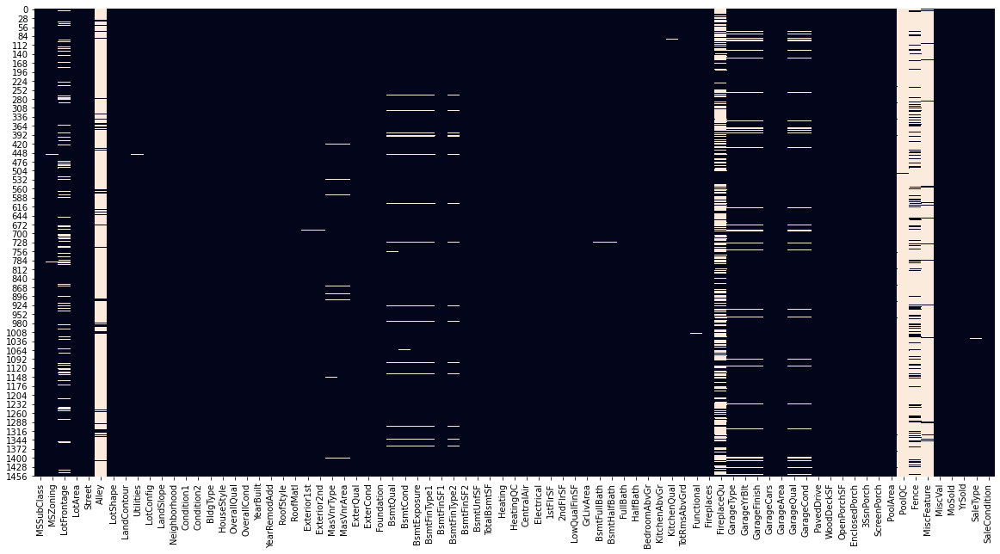

In [144]:
plt.figure(figsize=(20,10))
sns.heatmap(df.isna(), cbar=False)

In [145]:
nbre_val_manq = df.isnull().sum().sort_values(ascending=False)
percentmissing = (df.isnull().sum()/df.isnull().count()).sort_values(ascending=False)
wholena = pd.concat([nbre_val_manq,percentmissing], axis=1)
wholena.head(35)

,0,1
PoolQC,1456,0.997944
MiscFeature,1408,0.965045
Alley,1352,0.926662
Fence,1169,0.801234
FireplaceQu,730,0.500343
LotFrontage,227,0.155586
GarageYrBlt,78,0.053461
GarageFinish,78,0.053461
GarageQual,78,0.053461
GarageCond,78,0.053461


### Traitement des valeurs manquantes

In [146]:
# PoolQC : data description says NA means "no pool"
df.loc[:, "PoolQC"] = df.loc[:, "PoolQC"].fillna("No")


# MiscFeature : data description says NA means None
df.loc[:, "MiscFeature"] =  df.loc[:, "Alley"].fillna("None")

# Alley : data description says NA means "no alley access"
df.loc[:, "Alley"] =  df.loc[:, "Alley"].fillna("No")
# Fence : data description says NA means "no fence"
df.loc[:, "Fence"] =  df.loc[:, "Fence"].fillna("No")

# FireplaceQu : data description says NA means "no fireplace"
df.loc[:, "FireplaceQu"] =  df.loc[:, "FireplaceQu"].fillna("No")

# LotFrontage : NA most likely means no lot frontage
df.loc[:, "LotFrontage"] =  df.loc[:, "LotFrontage"].fillna(0)

# GarageType etc : data description says NA for garage features is "no garage" 
df.loc[:, "GarageType"] =  df.loc[:, "GarageType"].fillna("No")
df.loc[:, "GarageFinish"] =  df.loc[:, "GarageFinish"].fillna("No")
df.loc[:, "GarageQual"] =  df.loc[:, "GarageQual"].fillna("No")
df.loc[:, "GarageCond"] =  df.loc[:, "GarageCond"].fillna("No") 
df.loc[:, "GarageYrBlt"] =  df.loc[:, "GarageYrBlt"].fillna(0)

# BsmtQual etc : data description says NA for basement features is "no basement" and error for id 333 and 949
# df.loc[333, "BsmtFinType2"] =  df.loc[333, "BsmtFinType2"].fillna("freq")
# df.loc[949, "BsmtExposure"] =  df.loc[949, "BsmtExposure"].fillna("most_frequent")
df.loc[:, "BsmtQual"] =  df.loc[:, "BsmtQual"].fillna("No")
df.loc[:, "BsmtCond"] =  df.loc[:, "BsmtCond"].fillna("No")
df.loc[:, "BsmtExposure"] =  df.loc[:, "BsmtExposure"].fillna("No")
df.loc[:, "BsmtFinType1"] =  df.loc[:, "BsmtFinType1"].fillna("No")
df.loc[:, "BsmtFinType2"] =  df.loc[:, "BsmtFinType2"].fillna("No")

# MasVnrType : NA most likely means no veneer
df.loc[:, "MasVnrType"] =  df.loc[:, "MasVnrType"].fillna("None")
df.loc[:, "MasVnrArea"] =  df.loc[:, "MasVnrArea"].fillna(0)

 # Analyse univariée

Considérons le partitionnemnt suivant pour analyser les données. Les variables ont à quelques exceptions près les mêmes distributions que sur le train set . Toutefois, notons que toutes les maisons offre les mêmes facilités (utilities)

In [147]:
df_cat=df[['MSZoning', 'LandContour', 'LotConfig', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 
                 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st','Exterior2nd', 'MasVnrType',  'Foundation',
                 'Heating',  'CentralAir','Functional', 'GarageType',  'MiscFeature','SaleType','Fence', 
                 'SaleCondition','Electrical']]

In [148]:
df_num=df[[ 'LotFrontage', 'LotArea', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2',
       'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF','GrLivArea', 'BsmtFullBath','BsmtHalfBath', 
        'FullBath', 'HalfBath','BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces','GarageYrBlt', 'GarageCars',
        'GarageArea', 'WoodDeckSF', 'OpenPorchSF','EnclosedPorch', '3SsnPorch', 'ScreenPorch','MoSold', 'YrSold']]

In [149]:
df_ord =df[['MSSubClass','OverallQual','OverallCond', 'LotShape','Street', 'Alley','Utilities','LandSlope',  'ExterQual','ExterCond',
                      'BsmtQual','BsmtCond','BsmtExposure', 'BsmtFinType1','BsmtFinType2','HeatingQC', 
                       'KitchenQual','FireplaceQu','GarageFinish', 'GarageQual','PavedDrive','GarageCond','PoolQC']]

In [150]:
for col in df_cat.select_dtypes('object'):
    print(f'{col :-<50} {df_cat[col].unique()}')

MSZoning------------------------------------------ ['RH' 'RL' 'RM' 'FV' 'C (all)' nan]
LandContour--------------------------------------- ['Lvl' 'HLS' 'Bnk' 'Low']
LotConfig----------------------------------------- ['Inside' 'Corner' 'FR2' 'CulDSac' 'FR3']
Neighborhood-------------------------------------- ['NAmes' 'Gilbert' 'StoneBr' 'BrDale' 'NPkVill' 'NridgHt' 'Blmngtn'
 'NoRidge' 'Somerst' 'SawyerW' 'Sawyer' 'NWAmes' 'OldTown' 'BrkSide'
 'ClearCr' 'SWISU' 'Edwards' 'CollgCr' 'Crawfor' 'Blueste' 'IDOTRR'
 'Mitchel' 'Timber' 'MeadowV' 'Veenker']
Condition1---------------------------------------- ['Feedr' 'Norm' 'PosN' 'RRNe' 'Artery' 'RRNn' 'PosA' 'RRAn' 'RRAe']
Condition2---------------------------------------- ['Norm' 'Feedr' 'PosA' 'PosN' 'Artery']
BldgType------------------------------------------ ['1Fam' 'TwnhsE' 'Twnhs' 'Duplex' '2fmCon']
HouseStyle---------------------------------------- ['1Story' '2Story' 'SLvl' '1.5Fin' 'SFoyer' '2.5Unf' '1.5Unf']
RoofStyle------------------

<ipython-input-151-b4d315e00459>:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()


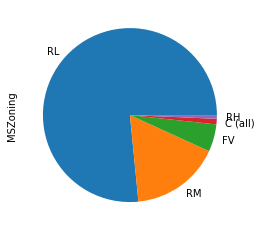

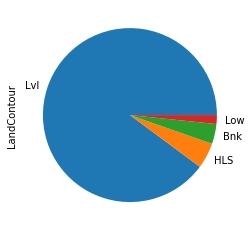

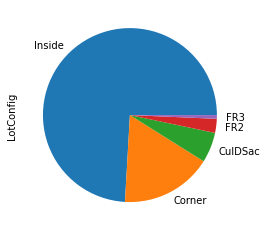

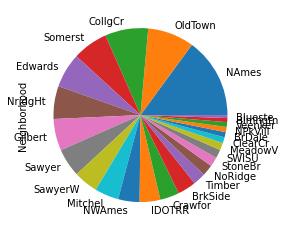

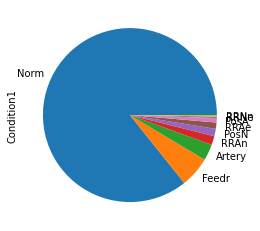

...

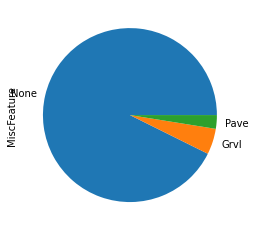

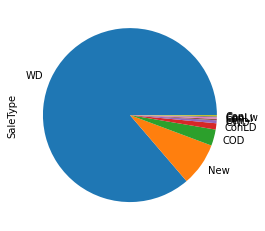

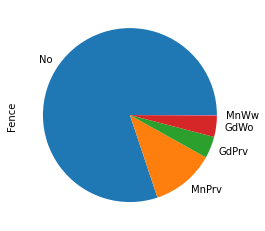

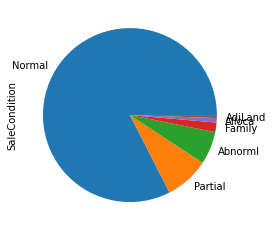

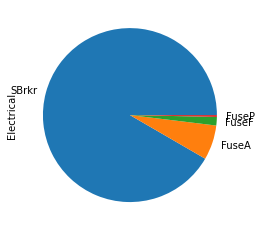

In [151]:
for col in df_cat.select_dtypes('object'):
    plt.figure()
    df_cat[col].value_counts().plot.pie()

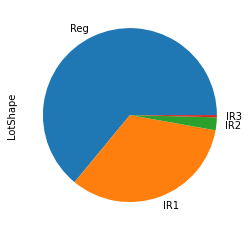

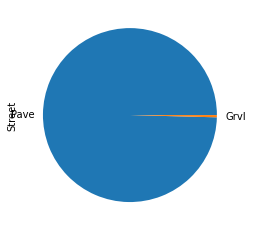

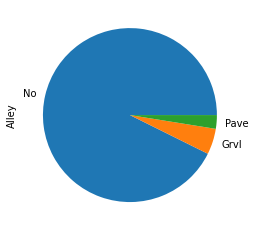

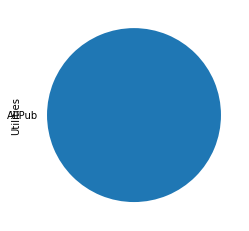

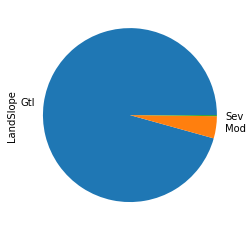

...

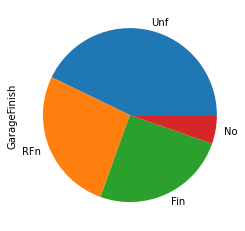

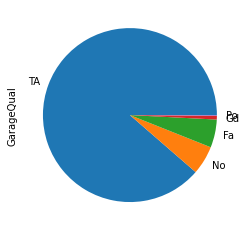

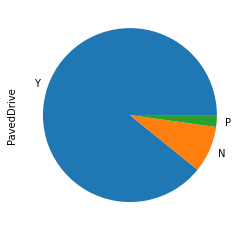

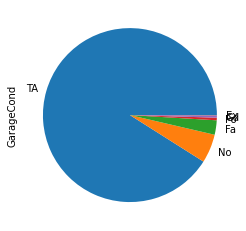

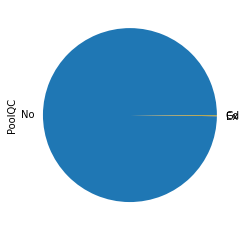

In [152]:
for col in df_ord.select_dtypes('object'):
    plt.figure()
    df_ord[col].value_counts().plot.pie()

C:\Users\DELL\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\DELL\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\DELL\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level 

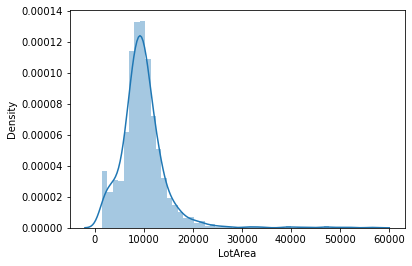

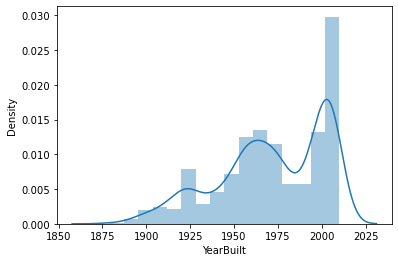

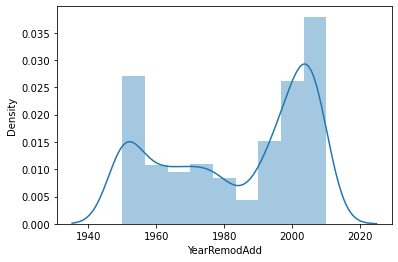

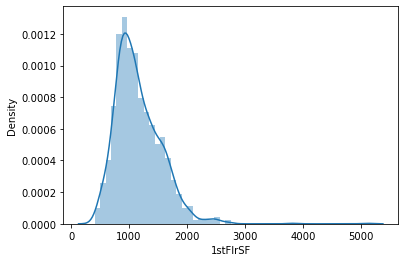

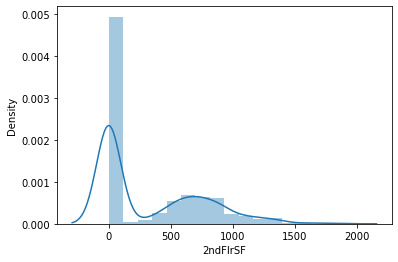

...

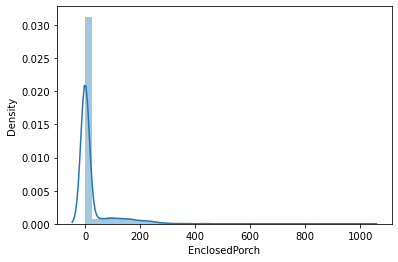

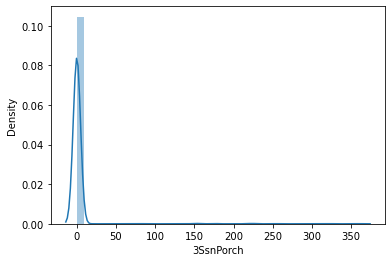

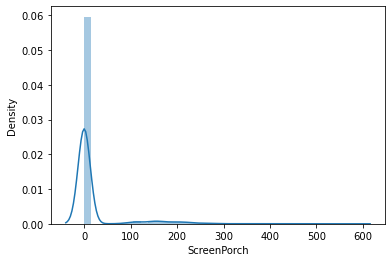

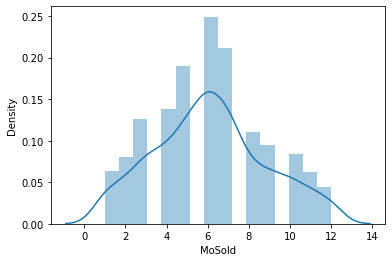

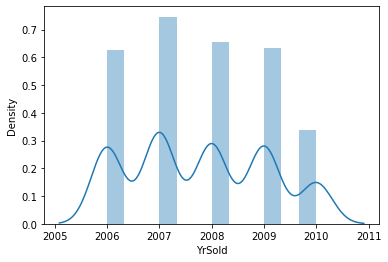

In [153]:
for col in df_num.select_dtypes('int64'):
    plt.figure()
    sns.distplot(df_num[col])

## ANALYSE MULTIVARIEE

Lorsqu'on compare les tableaux de corrélation (entre le train et le test), les relations entre les variables se sont légèrement dégradées dans le test set. Les interactions remarquables sont entre les variables numériques décrivant le garage, les variables GrilivArea, BedroomAbvGr, gaarageYrBlt et  LotArea, LotFrontage, YearBuilt, YearRemondAdd, MasVnrArea,BsmtFinSF1
Nous remarquons que la variable overallqual, ayant le coefficient de corrélations le plus élevé avec la variable à prédire  dans le train est toujours fortement correlé avec les variables ExterQual, BsmtQual, HeatingQC, GarageFinish, KitchenQual.


In [154]:
Rapport4=ProfileReport(df_ord,
                        title="df_ord",
        
                                    )
Rapport4

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [155]:
Rapport5=ProfileReport(df_cat,
                        title="df_cat",
        
                                    )
Rapport5

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# Conclusion

pour construire un modèle de régréssion multiple entre les plusieurs variables, il est nécessaire d'étudier la linéarité entre la variable cible et les variables explicatives.
la regréssion multiple exprime une relation entre plusieurs variables explicatives et traduit l'interdépendance entre l'impact d'une variable (sur la variable cible) et les valeurs prises par les autres variables